## Things that should only have to be defined once, here at the top
---

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import igrins_mod as ig # Custom module file for igrins shenanigans

import glob
import os
import warnings

import astropy.units as u
from astroquery.nist import Nist # atomic lines
# from astroquery.linelists.cdms import CDMS # molecular lines?

from lmfit import Model, Parameters
from lmfit.models import VoigtModel, LorentzianModel, SkewedGaussianModel, SkewedVoigtModel

from muler.igrins import IGRINSSpectrum, IGRINSSpectrumList

from tqdm import tqdm

# from scipy.integrate import trapz, simpson
# from scipy.signal import savgol_filter

from astropy.io import fits

# Plotting Parameters
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] =18

plt.rcParams['legend.fontsize'] = 16
plt.rcParams['figure.titlesize'] = 20

plt.rcParams['axes.labelweight']='bold'
plt.rcParams['axes.linewidth'] = 3

plt.rcParams['xtick.major.size'] = 10
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['xtick.minor.size'] = 5

plt.rcParams['ytick.major.size'] = 10
plt.rcParams['ytick.minor.visible'] = True
plt.rcParams['ytick.minor.size'] = 5

plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.direction'] = 'in'

%matplotlib inline

In [2]:
# Size of 1 spectral resolution element
# IGRINS Spectral Resolution
spec_res = 0.00001

# Reduced and order-merged data filepath 
# Laptop Path
data_path = "C:\\Users\\Savio\\Documents\\GitHub\\IGRINS-Spectra\\IGRINS_Merged"

# File path for figures to live in
fig_path = "C:\\Users\\Savio\\Documents\\GitHub\\IGRINS-SpectraIGRINS_figs\\standards_spectra"

# Create the folder if it doesn't exist
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

# Nicole's merged K-band spectra of some Taurus Standards
# merged_standard_files = glob.glob(data_path + "/merged_standards/m*.fits")
standard_table = pd.read_csv('C:\\Users\\Savio\\Documents\\IGRINS-Spectra\\standard_table_v3.txt', index_col=0)  # csv of standards with file and Spectral Type, c/v TBA
proto_table = pd.read_csv('C:\\Users\\Savio\\Documents\\IGRINS-Spectra\\protostar_table.txt', index_col=0)

# mask for spectra with well defined peaks and little-to-no line blending
feature_mask = standard_table['Name'].isin( ['LkCa19', 'HBC427', 'LkCa4','Hubble4','V830Tau', 'L1551-55','L1551-51', 'Anon1','JH108', 'UXTauB', 'LkCa1'] )

standard_table = standard_table[feature_mask].reset_index(drop=True)

standards_path = standard_table['File']
standard_list = standard_table['File'].values

proto_path = proto_table['File']
proto_list = proto_table['File'].values

standard_stack = [] # initialize list of IGRINSSpectrum objects
proto_stack = []
num_orders = 25
order_len = 2048

for i in tqdm(range(len(standard_table))):
    spec = IGRINSSpectrumList.read(standards_path[i])\
            .trim_overlap(pivot=0.7)\
            .remove_nans().stitch()

    standard_stack.append(spec)

for i in tqdm(range(len(proto_table))):
    spec = IGRINSSpectrumList.read(proto_path[i])\
            .trim_overlap(pivot=0.7)\
            .remove_nans().stitch()

    proto_stack.append(spec)

# Determine the maximum length of flux arrays for the standards
max_flux_length = max(len(spec.flux.value) for spec in standard_stack)
max_wavelen_length = max(len(spec.wavelength.value) for spec in standard_stack)
max_snr_length = max(len(spec.snr.value) for spec in standard_stack)
max_unc_length = max(len(spec.uncertainty.array) for spec in standard_stack)

# Initialize stacks with NaN values
wavelen_stack = np.full((max_wavelen_length, len(standard_table)), np.nan)
flux_stack = np.full((max_flux_length, len(standard_table)), np.nan)
snr_stack = np.full((max_snr_length, len(standard_table)), np.nan)
flux_unc_stack = np.full((max_unc_length, len(standard_table)), np.nan)

for i in tqdm(range(len(standard_table))):
    # convert angstrom to micron
    wavelen = standard_stack[i].wavelength.value*1e-4
    flux = standard_stack[i].flux.value
    snr = standard_stack[i].snr.value
    raw_flux_err = standard_stack[i].uncertainty.array

    wavelen_mask = (wavelen > 2.1) & (wavelen < 2.39)
    flux_mask = (flux > 0)
    # flux_err_mask = (raw_flux_err < 0.1)
    
    mask = (wavelen_mask) & (flux_mask) #& (flux_err_mask)

    wavelen = wavelen[mask]
    flux = flux[mask]
    snr = snr[mask]
    raw_flux_err = raw_flux_err[mask]

    wavelen_stack[:len(wavelen),i] = wavelen
    flux_stack[:len(flux),i] = flux
    snr_stack[:len(snr),i] = snr
    flux_unc_stack[:len(raw_flux_err),i] = raw_flux_err

# Directly query NIST to find line features in K-band
with warnings.catch_warnings():  # Ignore warnings
    warnings.simplefilter('ignore') 
    lines_table = Nist.query(2.08*u.um,2.35*u.um,
                    linename = 'Na I, Sc I, Si I, Fe I, Al I, Mg I, Ca I, H I, Ti I',
                    energy_level_unit='eV',output_order='wavelength')

igrins_wav_cut = (lines_table['Observed'] > 2.08) & (lines_table['Observed'] < 2.35)
lines_table = lines_table[igrins_wav_cut]
# lines_table = pd.read_csv('lines_table.txt')

# Make masks for the table of all the lines just in case I want to peek at certain transitions/wavelengths
na1_mask = lines_table['Spectrum'] == 'Na I'
sc1_mask = lines_table['Spectrum'] == 'Sc I'
si1_mask = lines_table['Spectrum'] == 'Si I'
fe1_mask = lines_table['Spectrum'] == 'Fe I'
al1_mask = lines_table['Spectrum'] == 'Al I'
mg1_mask = lines_table['Spectrum'] == 'Mg I'
ca1_mask = lines_table['Spectrum'] == 'Ca I'
h1_mask  = lines_table['Spectrum'] == 'H I'
ti1_mask = lines_table['Spectrum'] == 'Ti I'

# Just add all the masks to a list for the sake of my plotting a few cells down
mask_list = [na1_mask,sc1_mask,si1_mask,fe1_mask,al1_mask,mg1_mask,ca1_mask,h1_mask,ti1_mask]
color_list = ['purple', 'orange', 'green', 'blue', 'brown', 'crimson', 'olive', 'cyan', 'darkgreen']

na_reg_lines = sorted([lines_table[na1_mask][0]['Observed'],
                lines_table[sc1_mask][19]['Observed'],
                lines_table[si1_mask][2]['Observed'],
                lines_table[sc1_mask][20]['Observed'],
                lines_table[na1_mask][1]['Observed']])

na_reg_lines = np.array(na_reg_lines)

ca_reg_lines = list(lines_table[ca1_mask]['Observed'][:]) # list of Ca I lab wavelengths
ca_reg_lines.append(lines_table[fe1_mask]['Observed'][104])
ca_reg_lines = np.array(sorted(ca_reg_lines))

100%|██████████| 11/11 [00:00<00:00, 904.62it/s]


## Ca Region

Ca I 2.2614

Fe I 2.2626 = lines_table[fe1_mask][29]

Ca I 2.2631

Ca I 2.2657



  0%|          | 0/11 [00:00<?, ?it/s]

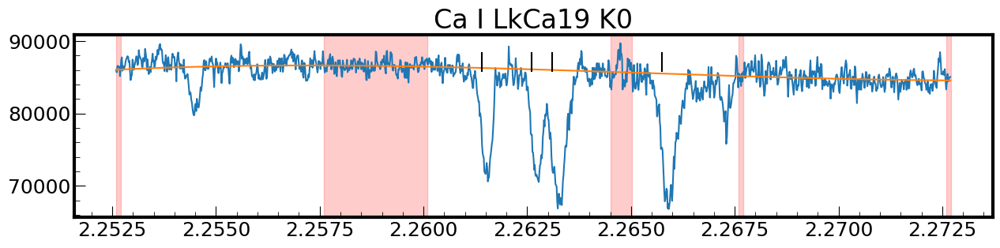

  9%|▉         | 1/11 [00:00<00:02,  3.59it/s]

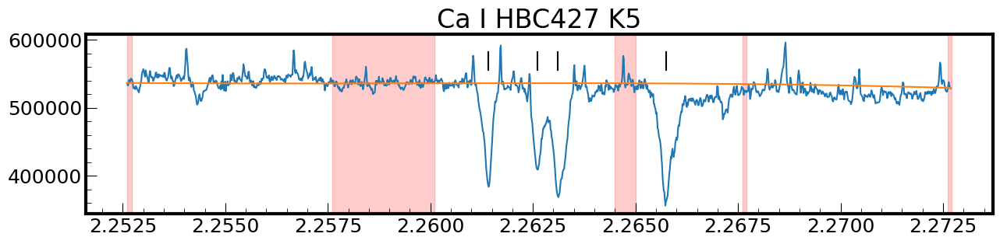

 18%|█▊        | 2/11 [00:00<00:02,  3.90it/s]

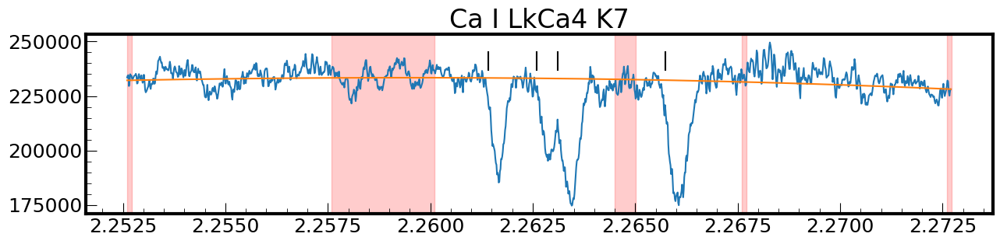

 27%|██▋       | 3/11 [00:00<00:02,  2.97it/s]

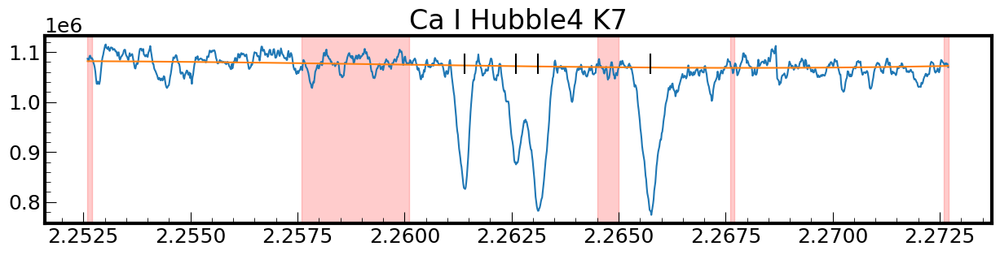

 36%|███▋      | 4/11 [00:01<00:02,  3.35it/s]

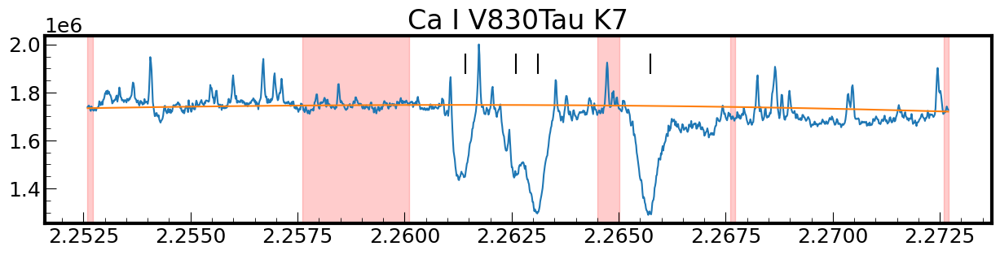

 45%|████▌     | 5/11 [00:01<00:01,  3.65it/s]

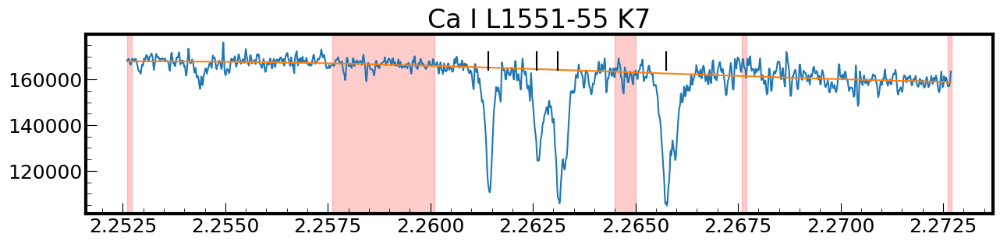

 55%|█████▍    | 6/11 [00:01<00:01,  3.84it/s]

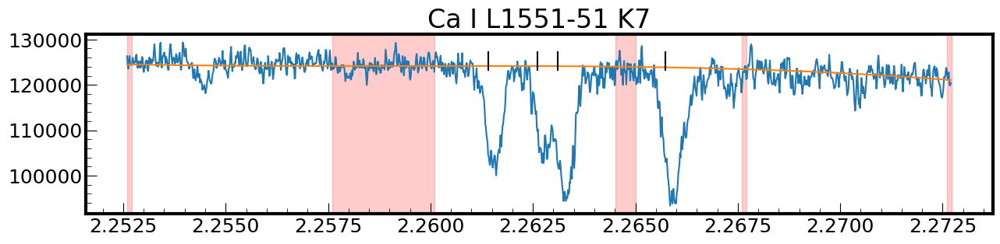

 64%|██████▎   | 7/11 [00:01<00:00,  4.19it/s]

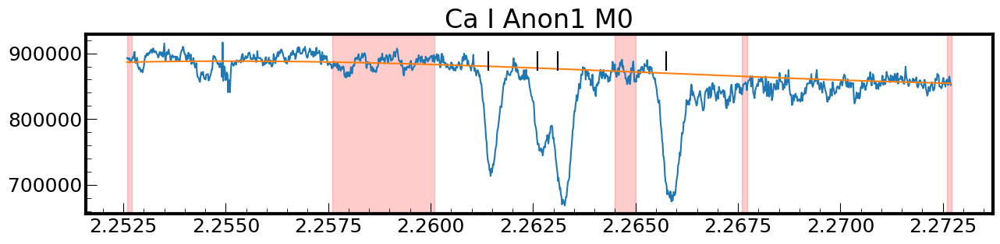

 73%|███████▎  | 8/11 [00:02<00:00,  4.25it/s]

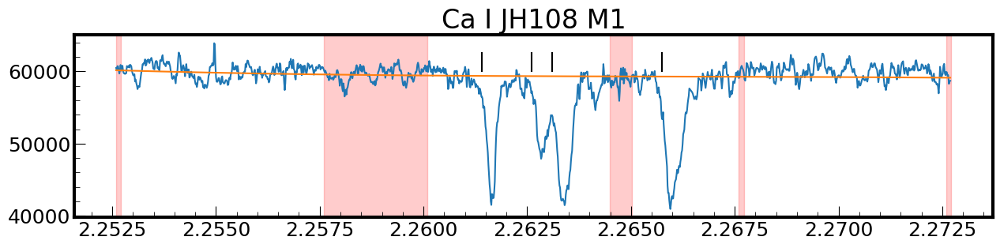

 82%|████████▏ | 9/11 [00:02<00:00,  4.24it/s]

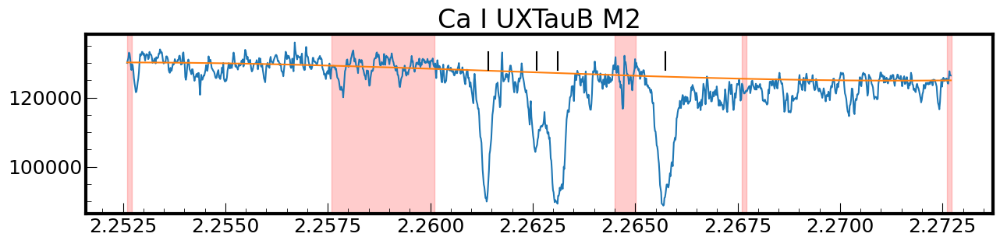

 91%|█████████ | 10/11 [00:02<00:00,  4.57it/s]

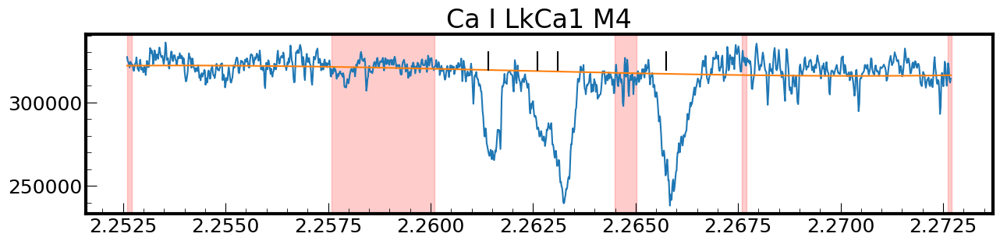

100%|██████████| 11/11 [00:02<00:00,  4.09it/s]


In [3]:
ca_reg_lines = list(lines_table[ca1_mask]['Observed'][:]) # list of Ca I lab wavelengths
ca_reg_lines.append(lines_table[fe1_mask]['Observed'][104])
ca_reg_lines = np.array(sorted(ca_reg_lines))

# Define the region for fitting
line_name = lines_table[ca1_mask][0]['Spectrum'] # Species
line_center = ca_reg_lines[1] # Wavelength

# from igrins_mod import local_continuum_fit
continuum_stack = []
continuum_err_stack = []
norm_flux_stack = []
norm_flux_err_stack = []
reg_idx_stack = []

# regions [left point,width]
regions = [(-1000,11), (-500,250), (190,51), (500,11) , (1000,11)]

# number of regions I use and subtract 1 since index starts at 0
n = len(regions)-1
poly_deg = 3
for i in tqdm(range(len(standard_table))):
    fig = plt.figure(figsize=(15,3))
    
    # Perform the continuum fit
    continuum, continuum_err, region_indices = ig.local_continuum_fit(wavelen_stack[:,i],
                                                       flux_stack[:,i],
                                                       flux_unc_stack[:,i],
                                                       poly_order = poly_deg,
                                                       line_center = line_center,
                                                       spec_res = spec_res,
                                                       regions = regions)
    # Append indices to list of indices
    reg_idx_stack.append(region_indices)
    
    # Append to list of local continuum arrays
    continuum_stack.append(continuum)
    continuum_err_stack.append(continuum_err)

    # Normalize flux by dividing the original flux by the continuum
    norm_flux = flux_stack[region_indices[0][0]:region_indices[n][1], i] / continuum
    norm_flux_stack.append(norm_flux)

    # Plot the raw flux and continuum
    plt.plot(wavelen_stack[region_indices[0][0]:region_indices[n][1], i], flux_stack[region_indices[0][0]:region_indices[n][1], i])
    plt.plot(wavelen_stack[region_indices[0][0]:region_indices[n][1], i], continuum_stack[i])

    # Highlight the regions and Ca I lines
    for j in range(len(region_indices)):
        plt.axvspan(wavelen_stack[region_indices[n - j][0], i], wavelen_stack[region_indices[n - j][1], i], color='red', alpha=0.2)

    for k in range(len(ca_reg_lines)):
        plt.axvline(ca_reg_lines[k], ymin=0.8, ymax=0.9, color='black')

    plt.title(f"{line_name} {standard_table['Name'][i]} {standard_table['Spectral_Type'][i]}")
    plt.show()

### 7/31/24 

compare methods of fitting (letting things float vs fixing them) \
compare fitted delta_lam vs lab delta_lam

consider printing offsets in centers from my original fitting method where centers are free and the new method where we fix the centers to be equal to lab wavelengths

lab wavelengths might be slightly off hence the need for all this

fit without beta, calculate the deltas using a high S/N line as the reference then fiddle with the lab wavelengths afterwards

### 8/5
test the delta lam for the not blended lines

Compare offset values between lab and fit values for the spectra with good composite fits
	so pick the ***good spectra*** and average the deltas of the deltas

look at the fractional sigmas of the fits (sigma/sigma_avg) where sigma is free parameter

should we really assume sigmas should be the same for all lines???

## Method 3

In [4]:
ca_reg_lines

array([2.26141 , 2.262601, 2.26311 , 2.265741])

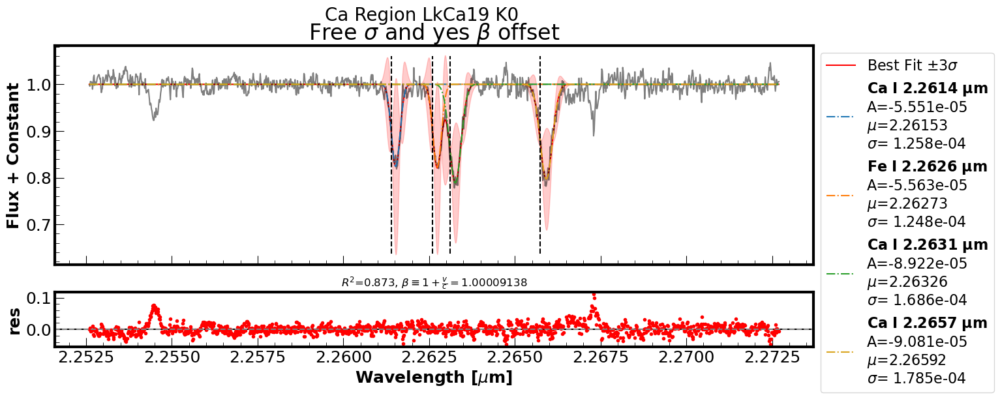

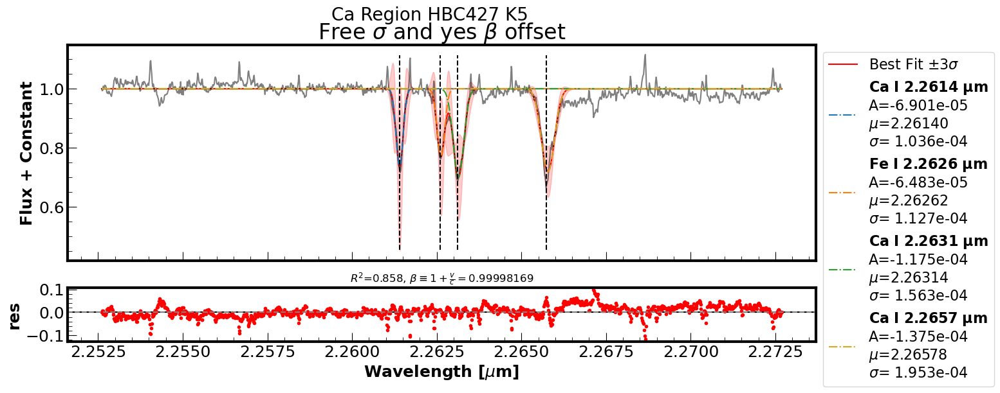

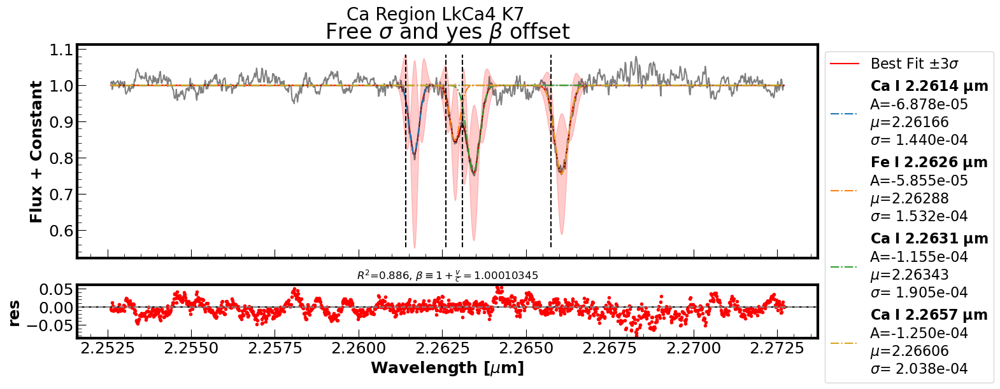

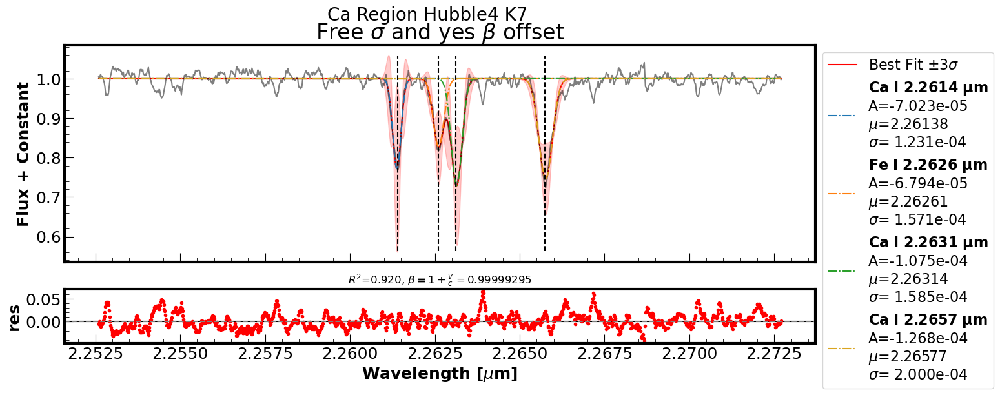

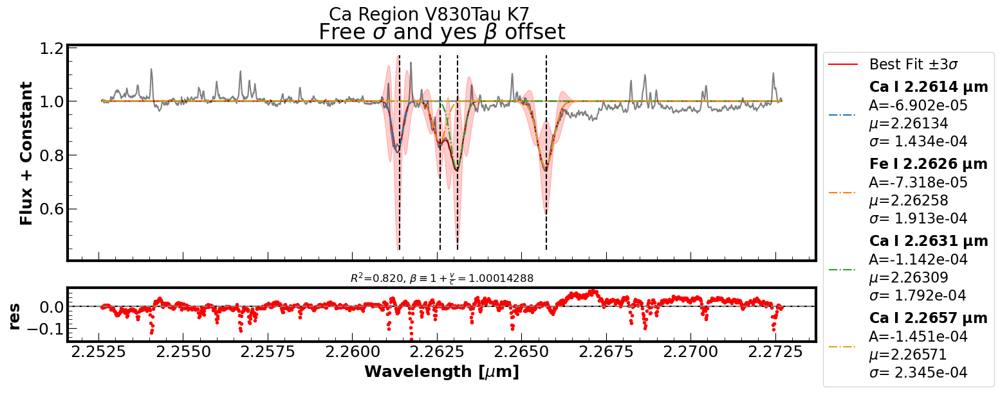

...

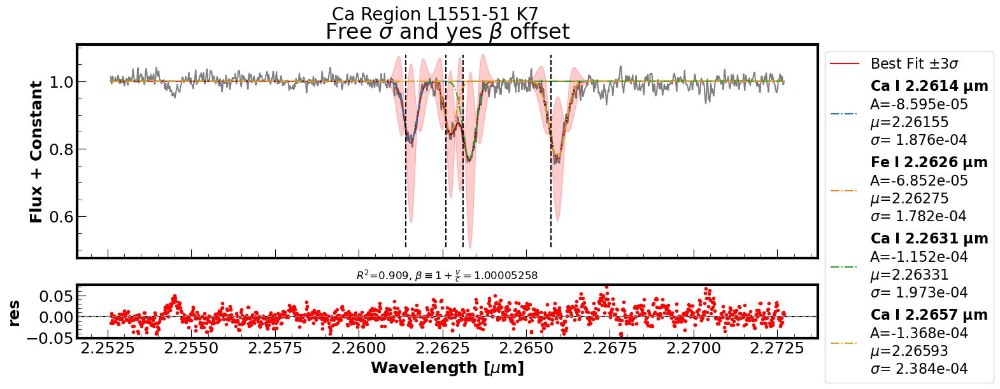

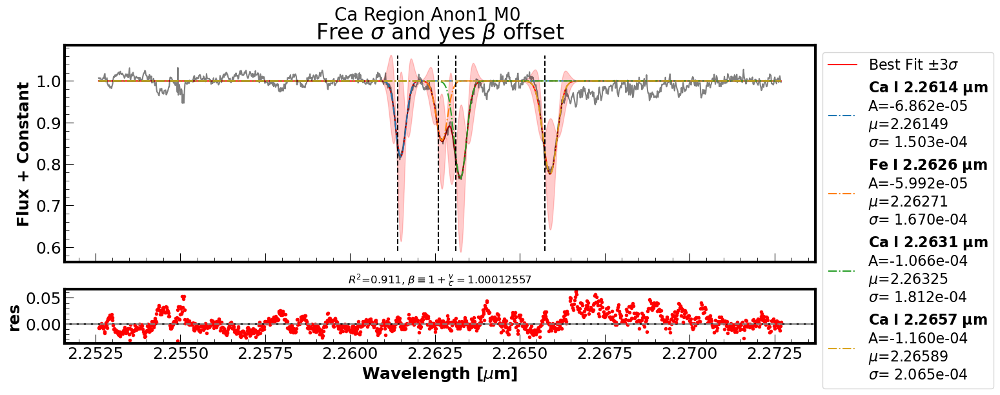

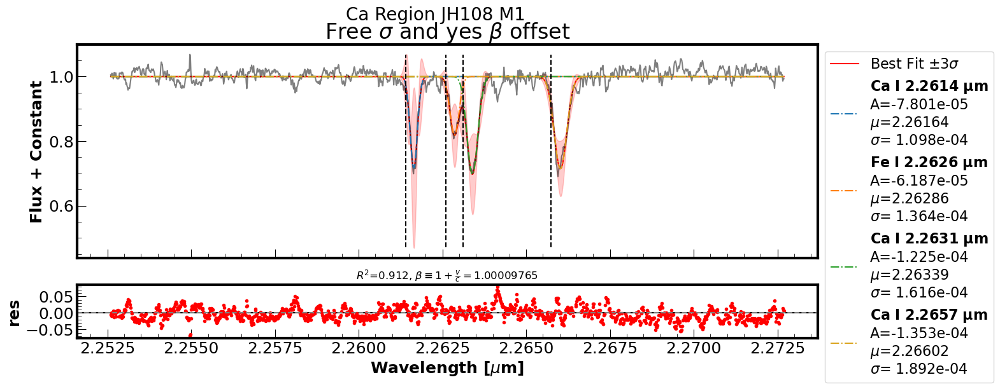

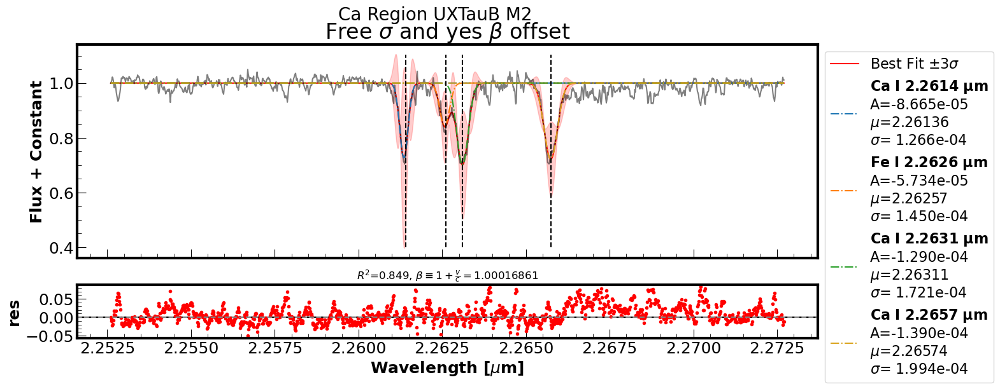

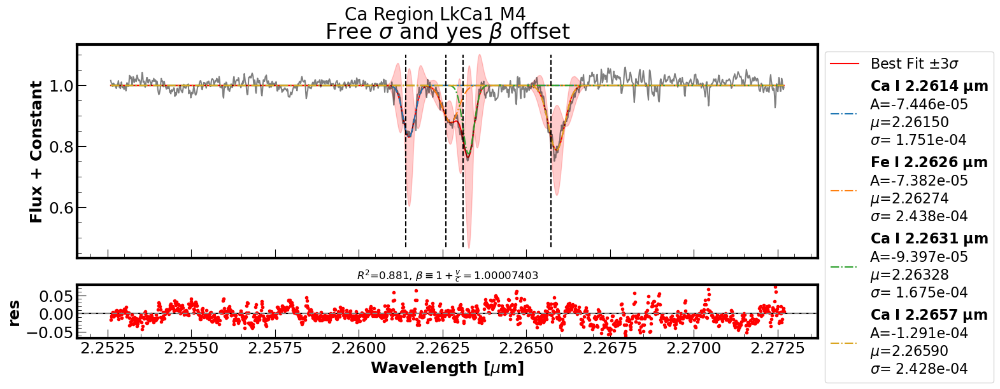

In [5]:
# Initialize storage lists
params_stack = []
beta_stack = []

params_error_stack = []

best_model_stack = []
result_stack = []
dely_stack = []

# For testing purposes
mean_sigma_stack = []

# ca_obs = ca_lines*(1+standard_table['v/c'][0]) # observed wavelengths (theoretically)

for i in range(len(standard_table)):    
    # Define initial parameters for Gaussian fitting
    params = Parameters()

    # Define Model
    # model = Model(ig.four_gaussian_beta, nan_policy='omit')
    gauss_model = Model(ig.four_gaussian_beta, nan_policy='omit')
    
    # extra_model = SkewedVoigtModel(prefix='m4_')

    model = gauss_model

    params.add('amp1', value = -2e-5, max = 0)
    params.add('c1', value = ca_reg_lines[0], max=ca_reg_lines[0]+10*spec_res)
    params.add('std1', min=0, value = 1.5e-4)

    params.add('amp2', value = -2e-5, max = 0)
    params.add('c2', value = ca_reg_lines[1], max=ca_reg_lines[1]+10*spec_res)
    params.add('std2', min=0, value = 1.5e-4)

    params.add('amp3', value = -2e-5, max = 0)
    params.add('c3', value = ca_reg_lines[2], max=ca_reg_lines[2]+10*spec_res)
    params.add('std3', min=0, value = 1.5e-4)

    params.add('amp4', value = -2e-5, max = 0)
    params.add('c4', value = ca_reg_lines[3], max=ca_reg_lines[3]+10*spec_res)
    params.add('std4', value = 1.5e-4)
    
    # hold widths to be the same
    # params['std2'].expr = 'std1'
    # params['std3'].expr = 'std1'
    # params['std4'].expr = 'std1'
    
    # Add parameters for the Voigt profile
    # params.add('m4_amplitude', value=-5e-5, max=0)
    # params.add('m4_center', value=ca_reg_lines[3])
    # params.add('m4_sigma', value=1.5e-4)
    # params.add('m4_gamma', value=1.5e-4)
    # params.add('m4_skew', value =1.5e-4)

    params.add('beta', value=1.) # beta = (1+v/c)

    # print(f"Length of norm_flux_stack[{i}]: {len(norm_flux_stack[i])}")
    # print(f"Length of wavelen_stack slice: {len(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])}")

    result = model.fit(norm_flux_stack[i], params,
                       x = wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])
                    #    weights = 1/flux_unc_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])

    result_stack.append(result) # lmfit ModelResult objects
    dely = result.eval_uncertainty(sigma=3) # lmfit uncertainty
    dely_stack.append(dely)

    # Append the best_model, error and parameters stacks
    # could probably make a loop to the tune of for value in result etc...
    params_stack.extend([result.params['amp1'].value, result.params['c1'].value, result.params['std1'].value,
                         result.params['amp2'].value, result.params['c2'].value, result.params['std2'].value,
                         result.params['amp3'].value, result.params['c3'].value, result.params['std3'].value,
                         result.params['amp4'].value, result.params['c4'].value, result.params['std4'].value])
                        #  result.params['m4_amplitude'].value, result.params['m4_center'].value, result.params['m4_sigma'].value])
                        

    beta_stack.append(result.params['beta'].value)
    
    params_error_stack.extend([result.params['amp1'].stderr, result.params['c1'].stderr, result.params['std1'].stderr,
                               result.params['amp2'].stderr, result.params['c2'].stderr, result.params['std2'].stderr,
                               result.params['amp3'].stderr, result.params['c3'].stderr, result.params['std3'].stderr,
                               result.params['amp4'].stderr, result.params['c4'].stderr, result.params['std4'].stderr])
                            #    result.params['m4_amplitude'].stderr, result.params['m4_center'].stderr, result.params['m4_sigma'].stderr])
                            

    best_model_stack.append(result.best_fit)
    mean_sigma_stack.append(np.mean(a=(result.params['std1'].value, result.params['std2'].value, result.params['std3'].value, result.params['std4'].value)))

    # print(result.fit_report())
    # print(f"Widths: {result.params['std1'].value:.8f}, {result.params['std2'].value:.8f}, {result.params['std3'].value:.8f}, {result.params['std4'].value:.8f}")
    # print(f"Mean Width: {np.mean(a= (result.params['std1'].value, result.params['std2'].value, result.params['std3'].value, result.params['std4'].value)):.8f}")

params_arr = np.array(params_stack)
# 0: amplitude
# 1: centers
# 2: sigmas
amps = params_arr[0::3] # grab every amplitude
amps_err = params_error_stack[0::3]

centers = params_arr[1::3] # grab every center wavelength
center_err = params_error_stack[1::3]

sigmas = params_arr[2::3] # grab every sigma
sigmas_err = params_error_stack[2::3]

# print(centers)
# Gaussian model fits for each source
ca1_2_2614_fits = []
ca1_2_2631_fits = []
ca1_2_2657_fits = []
fe1_2_2626_fits = []
num_gauss = 4

# # Getting the individual Gaussians into their own lists
for i in range(len(standard_table)):
    ca1_2_2614_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[0::num_gauss][i], centers[0::num_gauss][i]*beta_stack[i], sigmas[0::num_gauss][i]))
    fe1_2_2626_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[1::num_gauss][i], centers[1::num_gauss][i]*beta_stack[i], sigmas[1::num_gauss][i]))
    ca1_2_2631_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[2::num_gauss][i], centers[2::num_gauss][i]*beta_stack[i], sigmas[2::num_gauss][i]))
    ca1_2_2657_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[3::num_gauss][i], centers[3::num_gauss][i]*beta_stack[i], sigmas[3::num_gauss][i]))
    

# Plotting each component Gaussian and the best model fit
for i in range(len(standard_table)):
    # Create subplots with adjusted size ratios
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6), gridspec_kw={'height_ratios': [4, 1]}, sharex=True)

    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], best_model_stack[i], c='red', label=r'Best Fit $\pm 3 \sigma$')
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], norm_flux_stack[i], c='black', alpha=0.5)
    # ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], result_stack[i].init_fit, '--', c='blue' , alpha=0.2, label='initial fit')

    ax1.fill_between(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i],
                    best_model_stack[i]-dely_stack[i], best_model_stack[i]+dely_stack[i],
                    alpha=0.2, color = 'red' )

    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2614_fits[i], ls='-.',
        label=r'$\bf{Ca~I~2.2614~\mu m}$' "\n" rf"A={amps[0::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[0::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[0::num_gauss][i]:.3e}")
    # rf"$\pm {amps_err[0::num_gauss][i]:.3e}$"
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], fe1_2_2626_fits[i], ls='-.',
        label=r'$\bf{Fe~I~2.2626~\mu m}$' "\n" rf"A={amps[1::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[1::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[1::num_gauss][i]:.3e}")
    
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2631_fits[i], ls='-.',
        label=r'$\bf{Ca~I~2.2631~\mu m}$' "\n" rf"A={amps[2::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[2::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[2::num_gauss][i]:.3e}")
    
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2657_fits[i], ls='-.', color='goldenrod',
        label=r'$\bf{Ca~I~2.2657~\mu m}$' "\n" rf"A={amps[3::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[3::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[3::num_gauss][i]:.3e}")
    
    for j in range(len(ca_reg_lines)):
        ax1.axvline(ca_reg_lines[j], ymin=0.05, ymax=0.95,ls='--', color='black')
    
    plt.suptitle(rf"Ca Region {standard_table['Name'][i]} {standard_table['Spectral_Type'][i]}")

    ax1.set_ylabel('Flux + Constant')
    ax1.legend(bbox_to_anchor=(1,1))
    ax1.set_title(r'Free $\sigma$ and yes $\beta$ offset')

    # Calculate residuals
    residuals = (norm_flux_stack[i] - best_model_stack[i])
    # sqsum_res = np.sum(residuals**2)
    # sqsum = np.sum((norm_flux_stack[i]-np.mean(norm_flux_stack[i])**2))
    # R2 = 1-(sqsum_res/sqsum)

    # Plot residuals
    # ax2.scatter(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], residuals, c='red', label='Residuals', s=3)
    result_stack[i].plot_residuals(ax=ax2, datafmt='r.')
    
    ax2.axhline(y=0, color='grey', linestyle='--')
    # ax2.set_ylim(-0.1,0.1)
    ax2.set_xlabel(r'Wavelength [$\mu$m]')
    ax2.set_ylabel('res')
    ax2.set_title(rf"$R^2$={result_stack[i].rsquared:.3f}, " r'$\beta \equiv 1+\frac{v}{c}= $' f"{beta_stack[i]:.8f}", fontsize=12)

    plt.show()

In [6]:
delt_diff_stack = []
ref_line = 0 # reference spectral feature index

for i in range(len(standard_table)):
    # To store the differences for each spectrum
    delta_diff_spectrum = []
    for j in range(len(ca_reg_lines)):
        # fit line center and ref line center offset
        fit_ref_diff = np.abs(centers[j::num_gauss][i] - centers[ref_line::num_gauss][i])
        # print(fit_ref_diff)
        # lab line center and ref line center offset
        lab_ref_diff = np.abs(ca_reg_lines - ca_reg_lines[ref_line])[j]
        # print(lab_ref_diff)
        # difference between the delta wavelengths
        delta_diff = np.abs(fit_ref_diff - lab_ref_diff)
        # print(delta_diff)
        # append to list of differences for spectrum i
        delta_diff_spectrum.append(delta_diff)
        
    # append the differences for this spectrum to the main list
    delt_diff_stack.append(delta_diff_spectrum)

# creaty empty array with shape (num_of_sources, num_of_lines)
line_center_arr = np.empty(shape=(len(standard_table), len(ca_reg_lines)))
for i in range(len(standard_table)):
    # take lab wavelengths from NIST then add the delta of the wavelength offsets
    line_center_arr[i] = (ca_reg_lines + delt_diff_stack[i])

# create empty array with length of # of lines in spectral region
ca_reg_tweak = np.empty(shape=(len(ca_reg_lines)))

for j in range(len(ca_reg_lines)):
    # average the wavelength for each line
    # avg of line 1, line 2, etc.
    ca_reg_tweak[j] = np.mean(line_center_arr[:,j])

print("Tweaked Wavelength Array:", line_center_arr)
print("avg:", ca_reg_tweak)

Tweaked Wavelength Array: [[2.26141    2.26261836 2.26314723 2.26580002]
 [2.26141    2.26263037 2.26314839 2.26579027]
 [2.26141    2.26262883 2.26317471 2.26580485]
 [2.26141    2.26264117 2.26317285 2.26579493]
 [2.26141    2.26265669 2.26316412 2.26578681]
 [2.26141    2.26262015 2.26315192 2.26577986]
 [2.26141    2.26260699 2.26316869 2.26579329]
 [2.26141    2.2626217  2.26316337 2.2658089 ]
 [2.26141    2.2626278  2.26316133 2.26579005]
 [2.26141    2.26262772 2.26315947 2.26579439]
 [2.26141    2.26265755 2.26318774 2.26581473]]
avg: [2.26141    2.26263067 2.26316362 2.26579619]


In [7]:
ca_reg_tweak

array([2.26141   , 2.26263067, 2.26316362, 2.26579619])

## Tweak Wavlengths

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966691e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362365e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519450e-05


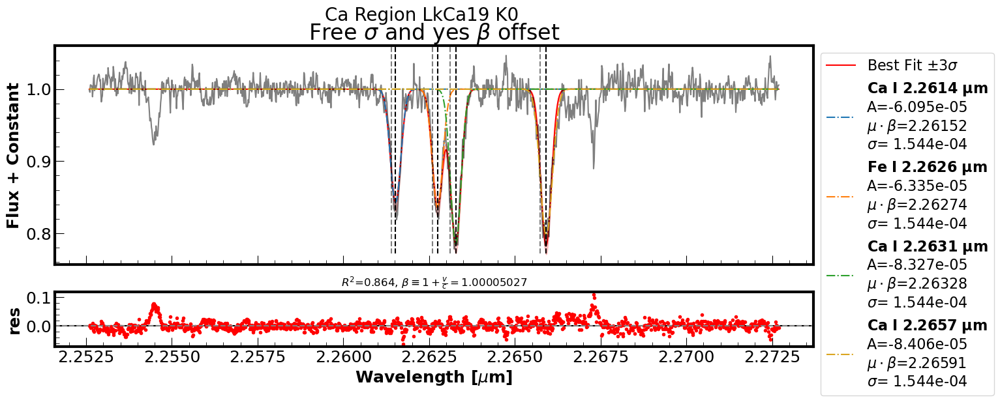

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966523e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362061e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519137e-05


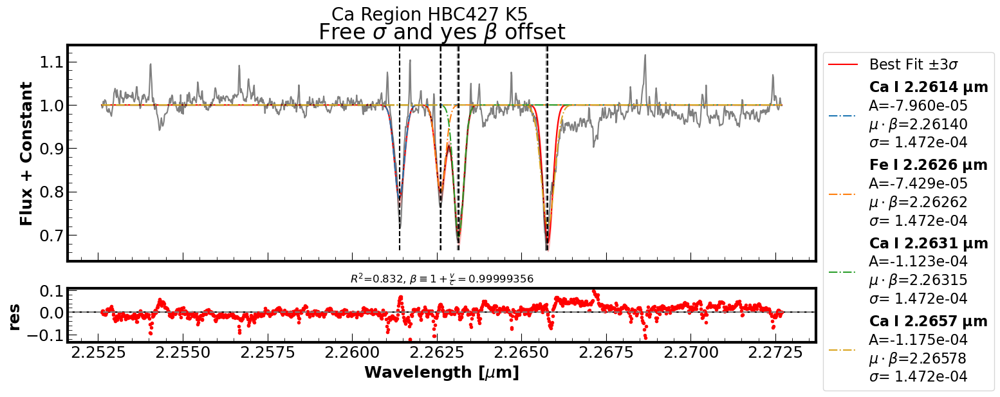

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966887e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362719e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519814e-05


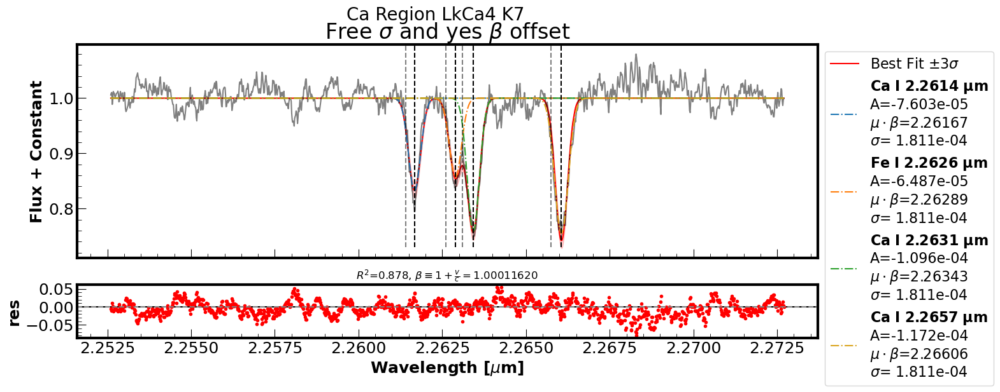

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966504e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362028e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519103e-05


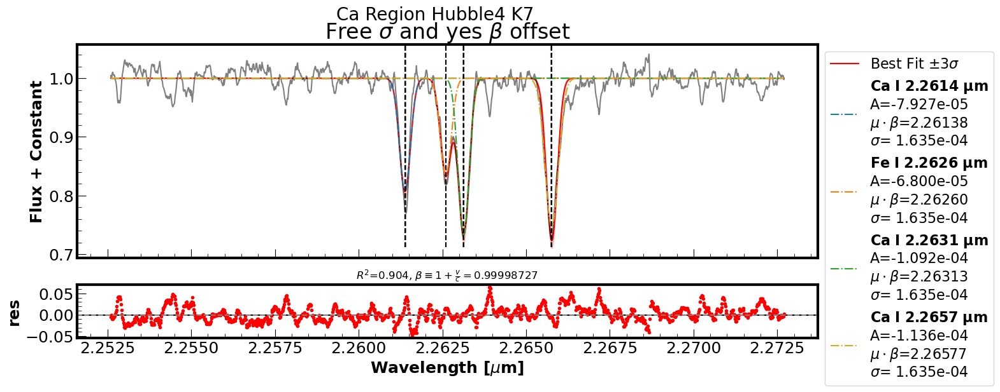

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966436e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.361904e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.518975e-05


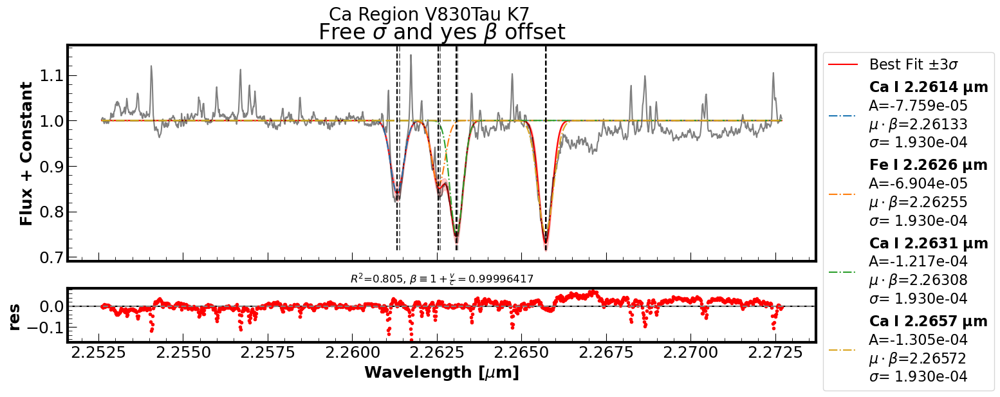

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966560e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362129e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519207e-05


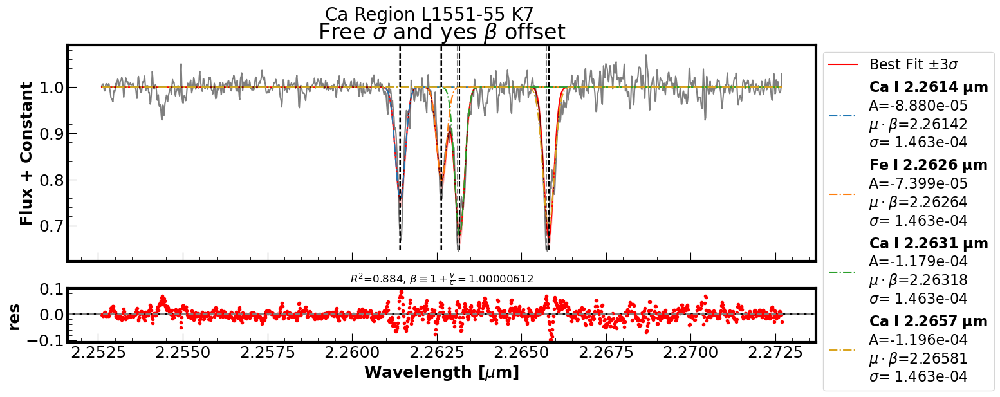

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966724e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362425e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519512e-05


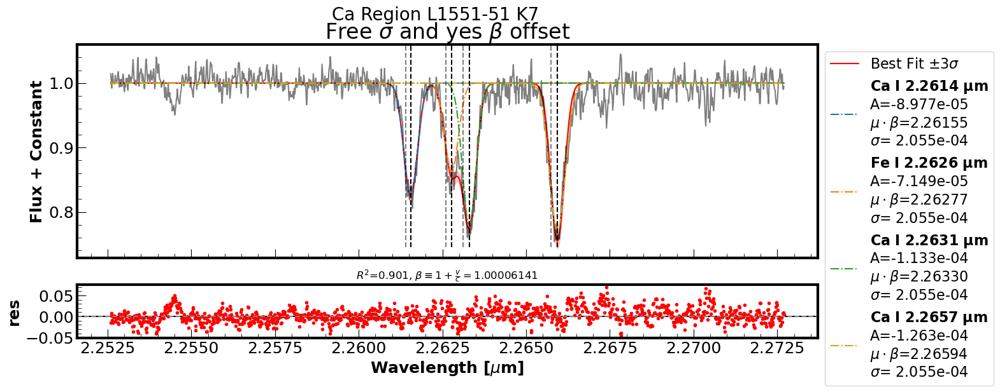

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966658e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362306e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519390e-05


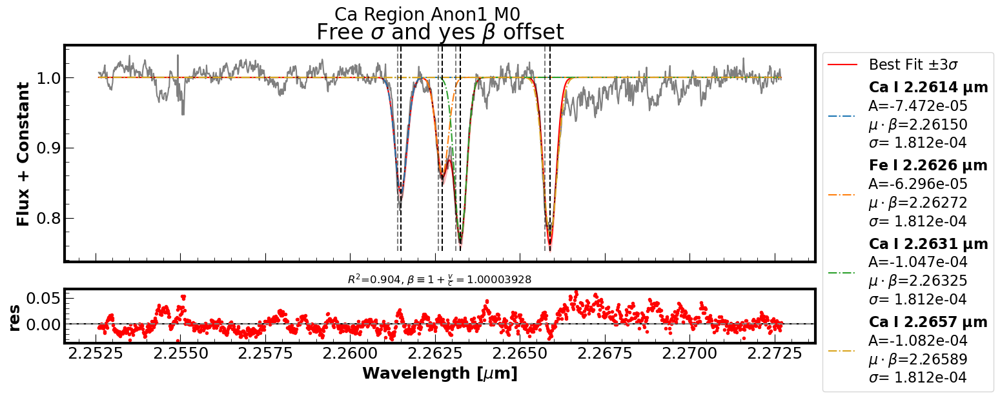

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966842e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362638e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519731e-05


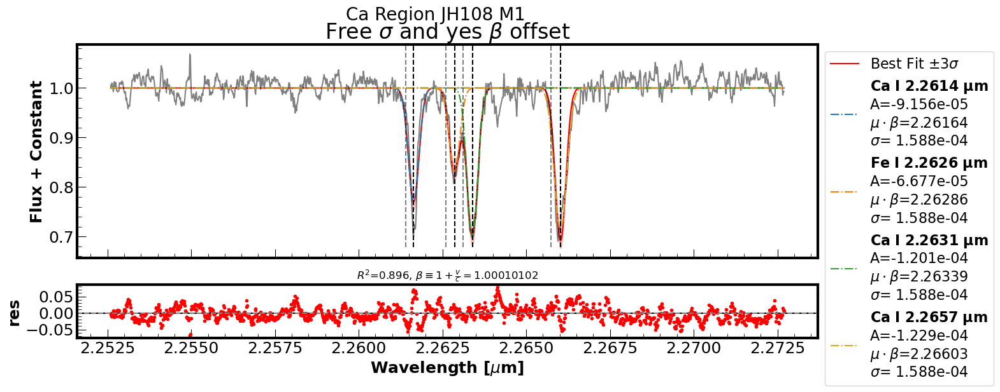

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966470e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.361965e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519039e-05


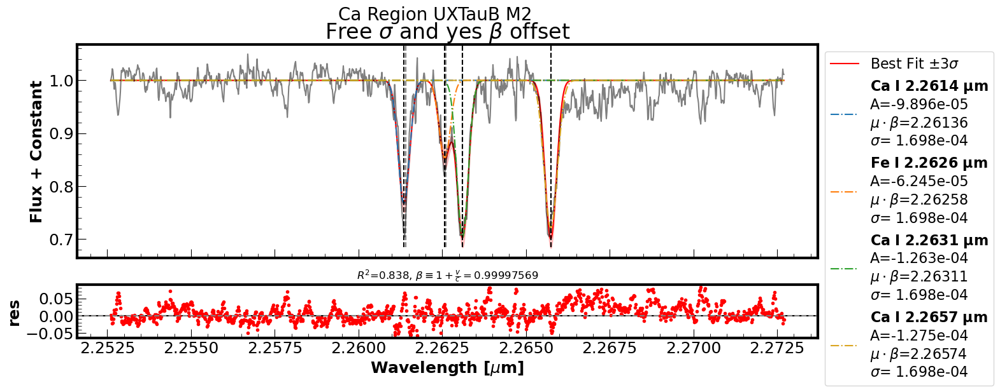

Offset from tweaked lab wavelength to fit center for line 1: 4.440892e-16
Offset from tweaked lab wavelength to fit center for line 2: 2.966660e-05
Offset from tweaked lab wavelength to fit center for line 3: 5.362309e-05
Offset from tweaked lab wavelength to fit center for line 4: 5.519393e-05


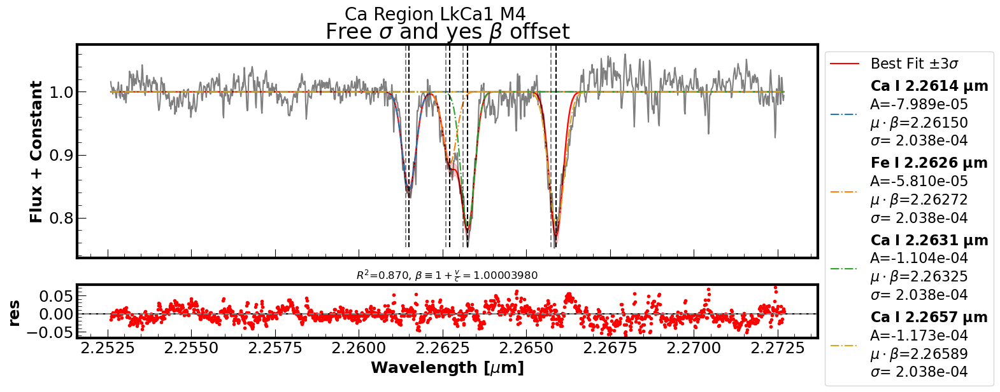

In [8]:
# Initialize storage lists
params_stack = []
beta_stack = []

params_error_stack = []

best_model_stack = []
result_stack = []
dely_stack = []

# For testing purposes
mean_sigma_stack = []

# ca_obs = ca_lines*(1+standard_table['v/c'][0]) # observed wavelengths (theoretically)

for i in range(len(standard_table)):
    # adjust lab wavelengths by the average 
    # ca_reg_tweak = ca_reg_lines + np.mean(delt_diff_stack[i])
    # Define initial parameters for Gaussian fitting
    params = Parameters()
    # Define Model
    model = Model(ig.four_gaussian_beta, nan_policy='omit')

    params.add('amp1', value = -2e-5, max = 0)
    params.add('c1', value = ca_reg_tweak[0])
    params.add('std1', min=0, value = 1.5e-4)

    params.add('amp2', value = -2e-5, max = 0)
    params.add('c2', value = ca_reg_tweak[1])
    params.add('std2', min=0, value = 1.5e-4)

    params.add('amp3', value = -2e-5, max = 0)
    params.add('c3', value = ca_reg_tweak[2])
    params.add('std3', min=0, value = 1.5e-4)

    params.add('amp4', value = -2e-5, max = 0)
    params.add('c4', value = ca_reg_tweak[3])
    params.add('std4', value = 1.5e-4)


    # tweak lab wavelengths
    params['c1'].expr = f'{ca_reg_tweak[0]}'
    params['c2'].expr = f'{ca_reg_tweak[1]}'
    params['c3'].expr = f'{ca_reg_tweak[2]}'
    params['c4'].expr = f'{ca_reg_tweak[3]}'

    params.add('beta', value=1.) # beta = (1+v/c)

    params['std2'].expr = 'std1' # constrain widths to be the same
    params['std3'].expr = 'std1'
    params['std4'].expr = 'std1'

    result = model.fit(norm_flux_stack[i], params,
                       x = wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])
                    #    weights = 1/flux_unc_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])

    result_stack.append(result) # lmfit ModelResult objects
    dely = result.eval_uncertainty(sigma=3) # lmfit uncertainty
    dely_stack.append(dely)

    # Append the best_model, error and parameters stacks
    # could probably make a loop to the tune of for value in result etc...
    params_stack.extend([result.params['amp1'].value, result.params['c1'].value, result.params['std1'].value,
                         result.params['amp2'].value, result.params['c2'].value, result.params['std2'].value,
                         result.params['amp3'].value, result.params['c3'].value, result.params['std3'].value,
                         result.params['amp4'].value, result.params['c4'].value, result.params['std4'].value])

    beta_stack.append(result.params['beta'].value)
    
    params_error_stack.extend([result.params['amp1'].stderr, result.params['c1'].stderr, result.params['std1'].stderr,
                               result.params['amp2'].stderr, result.params['c2'].stderr, result.params['std2'].stderr,
                               result.params['amp3'].stderr, result.params['c3'].stderr, result.params['std3'].stderr,
                               result.params['amp4'].stderr, result.params['c4'].stderr, result.params['std4'].stderr])

    best_model_stack.append(result.best_fit)
    mean_sigma_stack.append(np.mean(a=(result.params['std1'].value, result.params['std2'].value, result.params['std3'].value, result.params['std4'].value)))

    # print(result.fit_report())
    # print(f"Widths: {result.params['std1'].value:.8f}, {result.params['std2'].value:.8f}, {result.params['std3'].value:.8f}, {result.params['std4'].value:.8f}")
    # print(f"Mean Width: {np.mean(a= (result.params['std1'].value, result.params['std2'].value, result.params['std3'].value, result.params['std4'].value)):.8f}")

params_arr = np.array(params_stack)
# 0: amplitude
# 1: centers
# 2: sigmas
amps = params_arr[0::3] # grab every amplitude
amps_err = params_error_stack[0::3]

centers = params_arr[1::3] # grab every center wavelength
center_err = params_error_stack[1::3]

sigmas = params_arr[2::3] # grab every sigma
sigmas_err = params_error_stack[2::3]

# print(centers)
# Gaussian model fits for each source
ca1_2_2614_fits = []
ca1_2_2631_fits = []
# ca1_2_2657_fits = []
fe1_2_2626_fits = []
num_gauss = 4

# # Getting the individual Gaussians into their own lists
for i in range(len(standard_table)):
    ca1_2_2614_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[0::num_gauss][i], centers[0::num_gauss][i]*beta_stack[i], sigmas[0::num_gauss][i]))
    fe1_2_2626_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[1::num_gauss][i], centers[1::num_gauss][i]*beta_stack[i], sigmas[1::num_gauss][i]))
    ca1_2_2631_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[2::num_gauss][i], centers[2::num_gauss][i]*beta_stack[i], sigmas[2::num_gauss][i]))
    ca1_2_2657_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[3::num_gauss][i], centers[3::num_gauss][i]*beta_stack[i], sigmas[3::num_gauss][i]))
    

# Plotting each component Gaussian and the best model fit
for i in range(len(standard_table)):
    # ca_reg_tweak = ca_reg_lines + np.mean(delt_diff_stack[i])
    # Create subplots with adjusted size ratios
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6), gridspec_kw={'height_ratios': [4, 1]}, sharex=True)

    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], best_model_stack[i], c='red', label=r'Best Fit $\pm 3 \sigma$')
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], norm_flux_stack[i], c='black', alpha=0.5)
    # ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], result_stack[i].init_fit, '--', c='blue' , alpha=0.2, label='initial fit')

    ax1.fill_between(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i],
                    best_model_stack[i]-dely_stack[i], best_model_stack[i]+dely_stack[i],
                    alpha=0.2, color = 'red' )

    # plot each componenet
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2614_fits[i], ls='-.',
        label=r'$\bf{Ca~I~2.2614~\mu m}$' "\n" rf"A={amps[0::num_gauss][i]:.3e}" "\n" rf"$\mu \cdot \beta$={centers[0::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[0::num_gauss][i]:.3e}")
    # rf"$\pm {amps_err[0::num_gauss][i]:.3e}$"
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], fe1_2_2626_fits[i], ls='-.',
        label=r'$\bf{Fe~I~2.2626~\mu m}$' "\n" rf"A={amps[1::num_gauss][i]:.3e}" "\n" rf"$\mu \cdot \beta$={centers[1::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[1::num_gauss][i]:.3e}")
    
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2631_fits[i], ls='-.',
        label=r'$\bf{Ca~I~2.2631~\mu m}$' "\n" rf"A={amps[2::num_gauss][i]:.3e}" "\n" rf"$\mu \cdot \beta$={centers[2::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[2::num_gauss][i]:.3e}")
    
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2657_fits[i], ls='-.', color='goldenrod',
        label=r'$\bf{Ca~I~2.2657~\mu m}$' "\n" rf"A={amps[3::num_gauss][i]:.3e}" "\n" rf"$\mu \cdot \beta$={centers[3::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[3::num_gauss][i]:.3e}")
    
    for j in range(len(ca_reg_lines)):
        ax1.axvline(ca_reg_lines[j], ymin=0.05, ymax=1., color='black', ls='--', alpha=0.5)
        ax1.axvline(ca_reg_tweak[j]*beta_stack[i], ymin=0.05, ymax=1., color='black', ls='--')
        print(f"Offset from tweaked lab wavelength to fit center for line {j+1}: {np.abs(ca_reg_lines[j]*beta_stack[i]-(ca_reg_tweak[j])*beta_stack[i]):.6e}")
    
    plt.suptitle(rf"Ca Region {standard_table['Name'][i]} {standard_table['Spectral_Type'][i]}")

    ax1.set_ylabel('Flux + Constant')
    ax1.legend(bbox_to_anchor=(1,1))
    ax1.set_title(r'Free $\sigma$ and yes $\beta$ offset')

    # Calculate residuals
    residuals = (norm_flux_stack[i] - best_model_stack[i])
    # sqsum_res = np.sum(residuals**2)
    # sqsum = np.sum((norm_flux_stack[i]-np.mean(norm_flux_stack[i])**2))
    # R2 = 1-(sqsum_res/sqsum)

    # Plot residuals
    # ax2.scatter(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], residuals, c='red', label='Residuals', s=3)
    result_stack[i].plot_residuals(ax=ax2, datafmt='r.')
    
    ax2.axhline(y=0, color='grey', linestyle='--')
    # ax2.set_ylim(-0.1,0.1)
    ax2.set_xlabel(r'Wavelength [$\mu$m]')
    ax2.set_ylabel('res')
    ax2.set_title(rf"$R^2$={result_stack[i].rsquared:.3f}, " r'$\beta \equiv 1+\frac{v}{c}= $' f"{beta_stack[i]:.8f}", fontsize=12)

    plt.show()

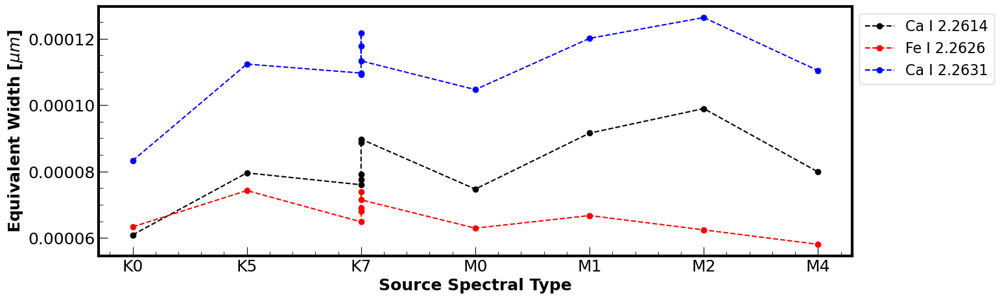

In [9]:
ew1_stack = []
ew2_stack = []
ew3_stack = []
ew4_stack = []

for i in range(len(standard_table)):
    ew1 = np.trapz(np.abs(1-ca1_2_2614_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    ew2 = np.trapz(np.abs(1-fe1_2_2626_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    ew3 = np.trapz(np.abs(1-ca1_2_2631_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    # ew4 = np.trapz(np.abs(1-ca1_2_2657_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    
    ew1_stack.append(ew1)
    ew2_stack.append(ew2)
    ew3_stack.append(ew3)
    # ew4_stack.append(ew4)

fig = plt.figure(figsize=(15,5))
# for i in range(len(standard_table)):

plt.plot(standard_table['Spectral_Type'], ew1_stack, ls='--', marker='o', c ='k', label = 'Ca I 2.2614')
plt.plot(standard_table['Spectral_Type'], ew2_stack, ls='--', marker='o', c ='red', label = 'Fe I 2.2626')
plt.plot(standard_table['Spectral_Type'], ew3_stack, ls='--', marker='o', c ='blue', label = 'Ca I 2.2631')
# plt.plot(standard_table['Spectral_Type'], ew4_stack, ls='--', marker='o', c ='green', label = 'Ca I 2.2657')

plt.xlabel('Source Spectral Type')
plt.ylabel(r'Equivalent Width [$\mu m$]')

plt.legend(bbox_to_anchor=(1,1))
plt.show()

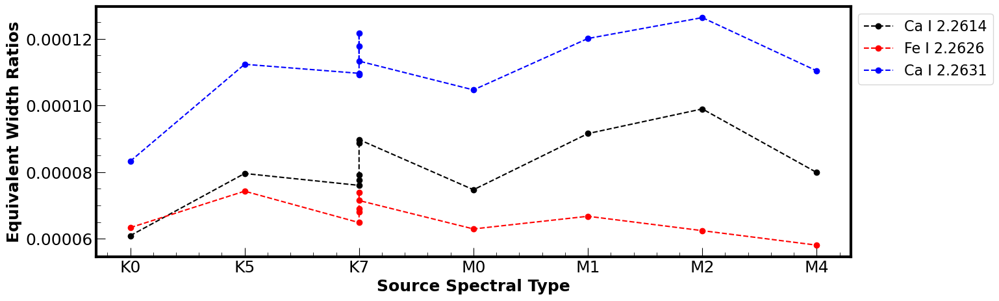

In [10]:
fig = plt.figure(figsize=(15,5))
# for i in range(len(standard_table)):

plt.plot(standard_table['Spectral_Type'], ew1_stack, ls='--', marker='o', c ='k', label = 'Ca I 2.2614')
plt.plot(standard_table['Spectral_Type'], ew2_stack, ls='--', marker='o', c ='red', label = 'Fe I 2.2626')
plt.plot(standard_table['Spectral_Type'], ew3_stack, ls='--', marker='o', c ='blue', label = 'Ca I 2.2631')
# plt.plot(standard_table['Spectral_Type'], ew4_stack, ls='--', marker='o', c ='green', label = 'Ca I 2.2657')

plt.xlabel('Source Spectral Type')
plt.ylabel(r'Equivalent Width Ratios')

plt.legend(bbox_to_anchor=(1,1))
plt.show()

# Try different models on 3rd Ca I line

In [11]:
# # Initialize storage lists
# params_stack = []
# beta_stack = []

# params_error_stack = []

# best_model_stack = []
# result_stack = []
# dely_stack = []

# # For testing purposes
# mean_sigma_stack = []

# # ca_obs = ca_lines*(1+standard_table['v/c'][0]) # observed wavelengths (theoretically)

# for i in range(len(standard_table)):
#     # Define Model
#     gauss_model = Model(ig.three_gaussian_beta, nan_policy='omit')
#     # extra_model = SkewedVoigtModel(prefix='m4_')
#     model = gauss_model

#     # Define initial parameters for Gaussian fitting
#     params = Parameters()

#     params.add('amp1', value = -3e-5, max = 0)
#     params.add('c1', value = ca_reg_tweak[0])
#     params.add('std1', min=0, value = 1.5e-4)

#     params.add('amp2', value = -3e-5, max = 0)
#     params.add('c2', value = ca_reg_tweak[1])
#     params.add('std2', min=0, value = 1.5e-4)

#     params.add('amp3', value = -3e-5, max = 0)
#     params.add('c3', value = ca_reg_tweak[2])
#     params.add('std3', min=0, value = 1.5e-4)

#     # Add parameters for the Voigt profile
#     # params.add('m4_amplitude', value=-5e-5, max=0)
#     # params.add('m4_center', value=ca_reg_tweak[3])
#     # params.add('m4_sigma', value=1.5e-4)
#     # params.add('m4_gamma', value=1.5e-4)
#     # params.add('m4_skew', value =1.5e-4)

#     # tweak lab wavelengths
#     params['c1'].expr = f'{ca_reg_tweak[0]}'
#     params['c2'].expr = f'{ca_reg_tweak[1]}'
#     params['c3'].expr = f'{ca_reg_tweak[2]}'
#     # params['m4_center'].expr = f'{ca_reg_tweak[3]}'

#     params.add('beta', value=1.) # beta = (1+v/c)
#     # Link the Lorentzian center to beta
#     # params['m4_center'].expr = f'{ca_reg_tweak[3]} * beta'

#     result = model.fit(norm_flux_stack[i], params,
#                        x = wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])
#                     #    weights = 1/flux_unc_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])

#     result_stack.append(result) # lmfit ModelResult objects
#     dely = result.eval_uncertainty(sigma=3) # lmfit uncertainty
#     dely_stack.append(dely)

#     # Append the best_model, error and parameters stacks
#     # could probably make a loop to the tune of for value in result etc...
#     params_stack.extend([result.params['amp1'].value, result.params['c1'].value, result.params['std1'].value,
#                          result.params['amp2'].value, result.params['c2'].value, result.params['std2'].value,
#                          result.params['amp3'].value, result.params['c3'].value, result.params['std3'].value])
#                         #  result.params['m4_amplitude'].value, result.params['m4_center'].value, result.params['m4_sigma'].value])

#     beta_stack.append(result.params['beta'].value)
    
#     # params_error_stack.extend([result.params['amp1'].stderr, result.params['c1'].stderr, result.params['std1'].stderr,
#     #                            result.params['amp2'].stderr, result.params['c2'].stderr, result.params['std2'].stderr,
#     #                            result.params['amp3'].stderr, result.params['c3'].stderr, result.params['std3'].stderr,
#     #                            result.params['amp4'].stderr, result.params['c4'].stderr, result.params['std4'].stderr])

#     best_model_stack.append(result.best_fit)
#     mean_sigma_stack.append(np.mean(a =(result.params['std1'].value,
#                                         result.params['std2'].value,
#                                         result.params['std3'].value)))
#                                         # result.params['m4_sigma'].value)))

#     # print(result.fit_report())
#     # print(f"Widths: {result.params['std1'].value:.8f}, {result.params['std2'].value:.8f}, {result.params['std3'].value:.8f}, {result.params['std4'].value:.8f}")
#     # print(f"Mean Width: {np.mean(a= (result.params['std1'].value, result.params['std2'].value, result.params['std3'].value, result.params['std4'].value)):.8f}")

# params_arr = np.array(params_stack)
# # 0: amplitude
# # 1: centers
# # 2: sigmas
# amps = params_arr[0::3] # grab every amplitude
# amps_err = params_error_stack[0::3]

# centers = params_arr[1::3] # grab every center wavelength
# center_err = params_error_stack[1::3]

# sigmas = params_arr[2::3] # grab every sigma
# sigmas_err = params_error_stack[2::3]

# # print(centers)
# # Gaussian model fits for each source
# ca1_2_2614_fits = []
# ca1_2_2631_fits = []
# ca1_2_2657_fits = []
# fe1_2_2626_fits = []
# num_gauss = 3

# # # Getting the individual Gaussians into their own lists
# for i in range(len(standard_table)):
#     ca1_2_2614_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[0::num_gauss][i], centers[0::num_gauss][i]*beta_stack[i], sigmas[0::num_gauss][i]))
#     fe1_2_2626_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[1::num_gauss][i], centers[1::num_gauss][i]*beta_stack[i], sigmas[1::num_gauss][i]))
#     ca1_2_2631_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[2::num_gauss][i], centers[2::num_gauss][i]*beta_stack[i], sigmas[2::num_gauss][i]))
#     # ca1_2_2657_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[3::num_gauss][i], centers[3::num_gauss][i]*beta_stack[i], sigmas[3::num_gauss][i]))

# # Plotting each component Gaussian and the best model fit
# for i in range(len(standard_table)):
#     # ca_reg_tweak = ca_reg_lines + np.mean(delt_diff_stack[i])
#     # Create subplots with adjusted size ratios
#     fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6), gridspec_kw={'height_ratios': [4, 1]}, sharex=True)

#     ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], best_model_stack[i], c='red', label=r'Best Fit $\pm 3 \sigma$')
#     ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], norm_flux_stack[i], c='black', alpha=0.5)
#     # ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], result_stack[i].init_fit, '--', c='blue' , alpha=0.2, label='initial fit')

#     ax1.fill_between(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i],
#                     best_model_stack[i]-dely_stack[i], best_model_stack[i]+dely_stack[i],
#                     alpha=0.2, color = 'red' )

#     # plot each componenet
#     ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2614_fits[i], ls='-.',
#         label=r'$\bf{Ca~I~2.2614~\mu m}$' "\n" rf"A={amps[0::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[0::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[0::num_gauss][i]:.3e}")
#     # rf"$\pm {amps_err[0::num_gauss][i]:.3e}$"
#     ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], fe1_2_2626_fits[i], ls='-.',
#         label=r'$\bf{Fe~I~2.2626~\mu m}$' "\n" rf"A={amps[1::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[1::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[1::num_gauss][i]:.3e}")
    
#     ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2631_fits[i], ls='-.',
#         label=r'$\bf{Ca~I~2.2631~\mu m}$' "\n" rf"A={amps[2::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[2::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[2::num_gauss][i]:.3e}")
    
#     # ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2657_fits[i], ls='-.', color='goldenrod',
#     #     label=r'$\bf{Ca~I~2.2657~\mu m}$' "\n" rf"A={amps[3::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[3::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[3::num_gauss][i]:.3e}")
    
#     # ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], best_model_stack[i]-ca1_2_2631_fits[i]-fe1_2_2626_fits[i]-ca1_2_2614_fits[i]+3, ls='-.', color='goldenrod',
#     #     label=r'$\bf{Ca~I~2.2657~\mu m}$' "\n" rf"A={result_stack[i].params['m4_amplitude'].value:.3e}" "\n" rf"$\mu$={result_stack[i].params['m4_center'].value:.5f}" "\n" rf"$\sigma$= {result_stack[i].params['m4_sigma'].value:.3e}")
    

#     for j in range(len(ca_reg_lines)):
#         ax1.axvline(ca_reg_lines[j]*beta_stack[i], ymin=0.05, ymax=0.95, color='black',alpha=0.4, ls='-.')
#         ax1.axvline(ca_reg_tweak[j]*beta_stack[i], ymin=0.05, ymax=1., color='black', ls='-.')
    
#     plt.suptitle(rf"Ca Region {standard_table['Name'][i]} {standard_table['Spectral_Type'][i]}")

#     ax1.set_ylabel('Flux + Constant')
#     ax1.legend(bbox_to_anchor=(1,1), frameon=False)
#     ax1.set_title(r'Free $\sigma$ and $\beta$ offset, w/ different model on last line')

#     # Plot residuals
#     # ax2.scatter(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], residuals, c='red', label='Residuals', s=3)
#     # result_stack[i].plot_residuals(ax=ax2, datafmt='r.',markersize=3)
#     ax2.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], result_stack[i].residual, 'r.', markersize=3)
#     ax2.axhline(y=0, color='grey', alpha=0.5, linestyle='--')
#     # ax2.set_ylim(-0.1,0.1)
#     ax2.set_xlabel(r'Wavelength [$\mu$m]')
#     ax2.set_ylabel('res')
#     ax2.set_title(rf"$R^2$={result_stack[i].rsquared:.3f}, " r'$\beta \equiv 1+\frac{v}{c}= $' f"{beta_stack[i]:.8f}", fontsize=12)

#     plt.show()

# All Sources

In [12]:
# Size of 1 spectral resolution element
# IGRINS Spectral Resolution
spec_res = 0.00001

# Reduced and order-merged data filepath 
# Laptop Path
data_path = "C:\\Users\\Savio\\Documents\\GitHub\\IGRINS-Spectra\\IGRINS_Merged"

# File path for figures to live in
fig_path = "C:\\Users\\Savio\\Documents\\GitHub\\IGRINS-SpectraIGRINS_figs\\standards_spectra"

# Create the folder if it doesn't exist
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

# Nicole's merged K-band spectra of some Taurus Standards
# merged_standard_files = glob.glob(data_path + "/merged_standards/m*.fits")
standard_table = pd.read_csv('C:\\Users\\Savio\\Documents\\IGRINS-Spectra\\standard_table_v3.txt', index_col=0)  # csv of standards with file and Spectral Type, c/v TBA
proto_table = pd.read_csv('C:\\Users\\Savio\\Documents\\IGRINS-Spectra\\protostar_table.txt', index_col=0)

standards_path = standard_table['File']
standard_list = standard_table['File'].values

proto_path = proto_table['File']
proto_list = proto_table['File'].values

standard_stack = [] # initialize list of IGRINSSpectrum objects
proto_stack = []
num_orders = 25
order_len = 2048

for i in tqdm(range(len(standard_table))):
    spec = IGRINSSpectrumList.read(standards_path[i])\
            .trim_overlap(pivot=0.7)\
            .remove_nans().stitch()

    standard_stack.append(spec)

for i in tqdm(range(len(proto_table))):
    spec = IGRINSSpectrumList.read(proto_path[i])\
            .trim_overlap(pivot=0.7)\
            .remove_nans().stitch()

    proto_stack.append(spec)

# Determine the maximum length of flux arrays for the standards
max_flux_length = max(len(spec.flux.value) for spec in standard_stack)
max_wavelen_length = max(len(spec.wavelength.value) for spec in standard_stack)
max_snr_length = max(len(spec.snr.value) for spec in standard_stack)
max_unc_length = max(len(spec.uncertainty.array) for spec in standard_stack)

# Initialize stacks with NaN values
wavelen_stack = np.full((max_wavelen_length, len(standard_table)), np.nan)
flux_stack = np.full((max_flux_length, len(standard_table)), np.nan)
snr_stack = np.full((max_snr_length, len(standard_table)), np.nan)
flux_unc_stack = np.full((max_unc_length, len(standard_table)), np.nan)

for i in tqdm(range(len(standard_table))):
    # convert angstrom to micron
    wavelen = standard_stack[i].wavelength.value*1e-4
    flux = standard_stack[i].flux.value
    snr = standard_stack[i].snr.value
    raw_flux_err = standard_stack[i].uncertainty.array

    wavelen_mask = (wavelen > 2.1) & (wavelen < 2.39)
    flux_mask = (flux > 0)
    # flux_err_mask = (raw_flux_err < 0.1)
    
    mask = (wavelen_mask) & (flux_mask) #& (flux_err_mask)

    wavelen = wavelen[mask]
    flux = flux[mask]
    snr = snr[mask]
    raw_flux_err = raw_flux_err[mask]

    wavelen_stack[:len(wavelen),i] = wavelen
    flux_stack[:len(flux),i] = flux
    snr_stack[:len(snr),i] = snr
    flux_unc_stack[:len(raw_flux_err),i] = raw_flux_err

# Directly query NIST to find line features in K-band
with warnings.catch_warnings():  # Ignore warnings
    warnings.simplefilter('ignore') 
    lines_table = Nist.query(2.08*u.um,2.35*u.um,
                    linename = 'Na I, Sc I, Si I, Fe I, Al I, Mg I, Ca I, H I, Ti I',
                    energy_level_unit='eV',output_order='wavelength')

igrins_wav_cut = (lines_table['Observed'] > 2.08) & (lines_table['Observed'] < 2.35)
lines_table = lines_table[igrins_wav_cut]
# lines_table = pd.read_csv('lines_table.txt')

# Make masks for the table of all the lines just in case I want to peek at certain transitions/wavelengths
na1_mask = lines_table['Spectrum'] == 'Na I'
sc1_mask = lines_table['Spectrum'] == 'Sc I'
si1_mask = lines_table['Spectrum'] == 'Si I'
fe1_mask = lines_table['Spectrum'] == 'Fe I'
al1_mask = lines_table['Spectrum'] == 'Al I'
mg1_mask = lines_table['Spectrum'] == 'Mg I'
ca1_mask = lines_table['Spectrum'] == 'Ca I'
h1_mask  = lines_table['Spectrum'] == 'H I'
ti1_mask = lines_table['Spectrum'] == 'Ti I'

# Just add all the masks to a list for the sake of my plotting a few cells down
mask_list = [na1_mask,sc1_mask,si1_mask,fe1_mask,al1_mask,mg1_mask,ca1_mask,h1_mask,ti1_mask]
color_list = ['purple', 'orange', 'green', 'blue', 'brown', 'crimson', 'olive', 'cyan', 'darkgreen']

na_reg_lines = sorted([lines_table[na1_mask][0]['Observed'],
                lines_table[sc1_mask][19]['Observed'],
                lines_table[si1_mask][2]['Observed'],
                lines_table[sc1_mask][20]['Observed'],
                lines_table[na1_mask][1]['Observed']])

na_reg_lines = np.array(na_reg_lines)

ca_reg_lines = list(lines_table[ca1_mask]['Observed'][:]) # list of Ca I lab wavelengths
ca_reg_lines.append(lines_table[fe1_mask]['Observed'][104])
ca_reg_lines = np.array(sorted(ca_reg_lines))

  0%|          | 0/23 [00:00<?, ?it/s]

100%|██████████| 23/23 [00:00<00:00, 1025.48it/s]


## Ca Region

Ca I 2.2614

Fe I 2.2626 = lines_table[fe1_mask][29]

Ca I 2.2631

Ca I 2.2657



  0%|          | 0/23 [00:00<?, ?it/s]

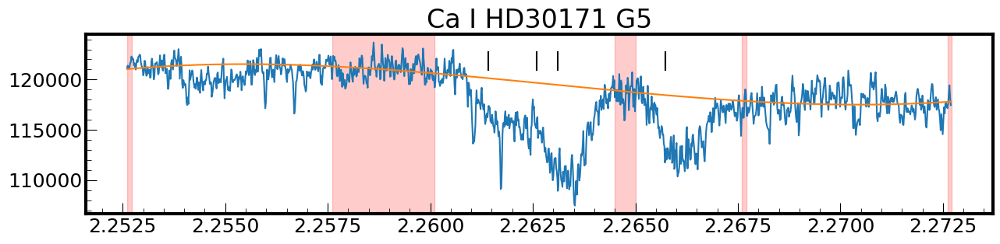

  4%|▍         | 1/23 [00:00<00:05,  4.39it/s]

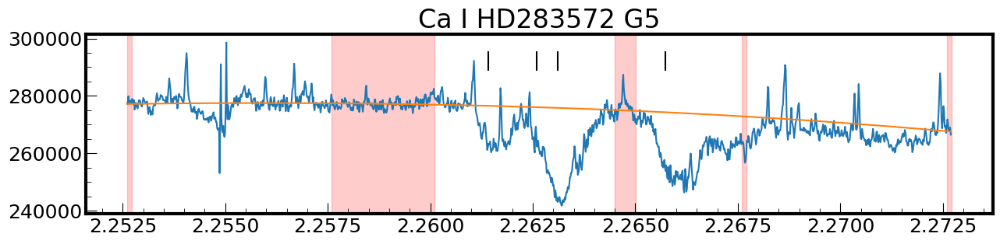

  9%|▊         | 2/23 [00:00<00:04,  5.06it/s]

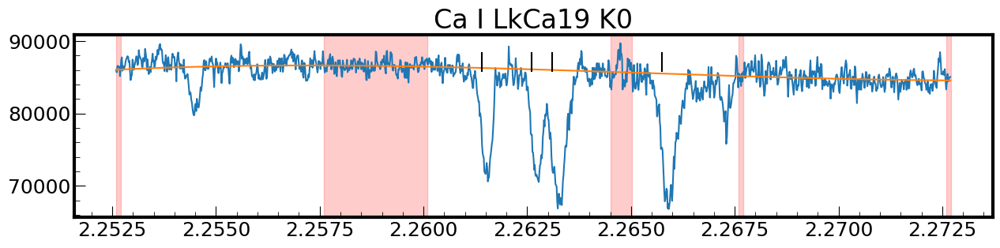

 13%|█▎        | 3/23 [00:00<00:03,  5.12it/s]

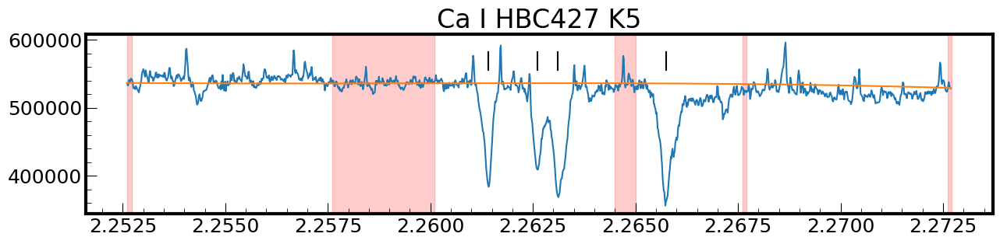

 17%|█▋        | 4/23 [00:00<00:04,  4.44it/s]

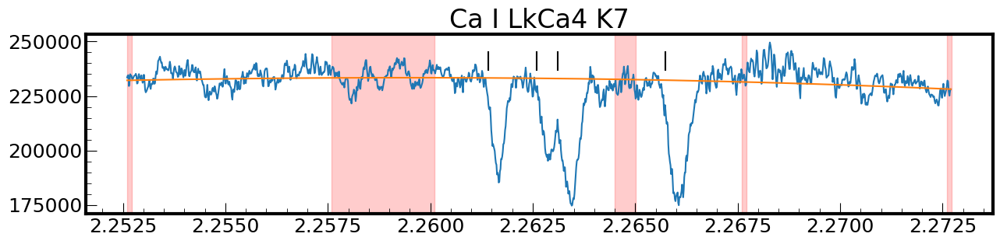

 22%|██▏       | 5/23 [00:01<00:03,  4.58it/s]

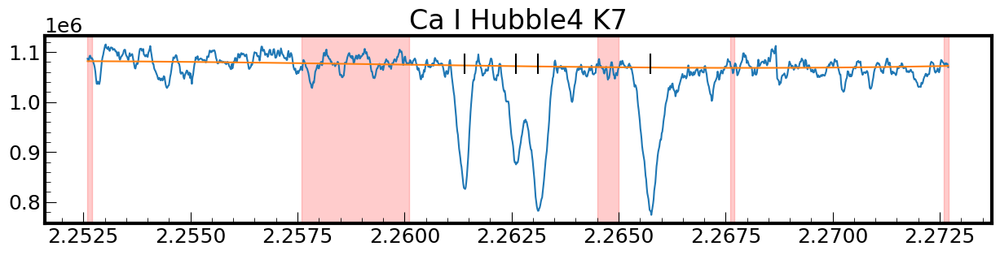

 26%|██▌       | 6/23 [00:01<00:03,  4.56it/s]

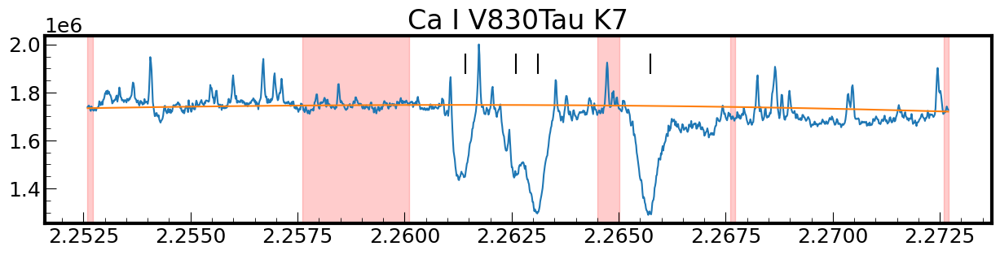

 30%|███       | 7/23 [00:01<00:03,  4.65it/s]

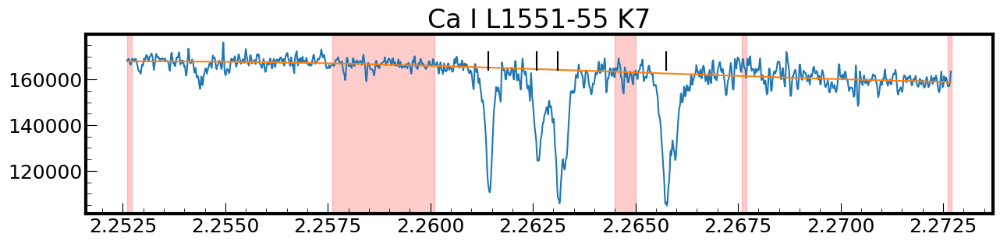

 35%|███▍      | 8/23 [00:01<00:03,  4.70it/s]

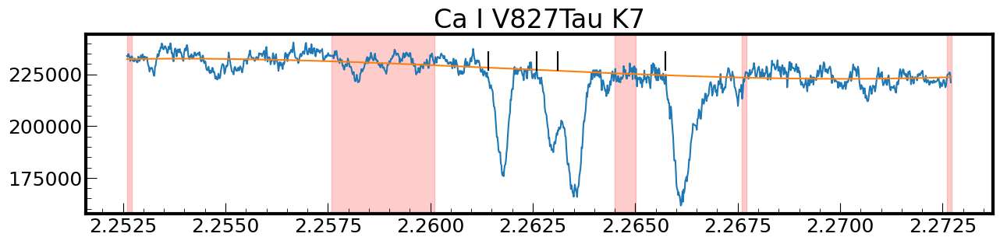

 39%|███▉      | 9/23 [00:01<00:03,  4.52it/s]

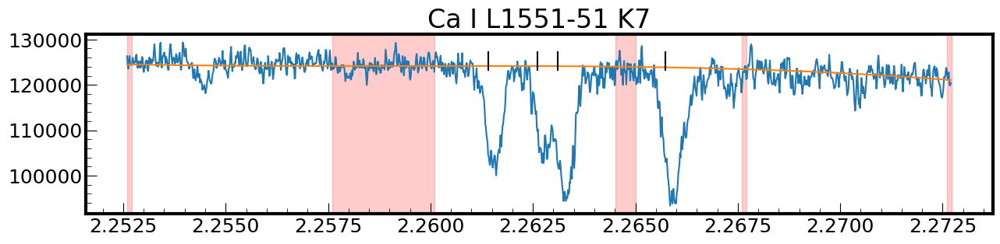

 43%|████▎     | 10/23 [00:02<00:04,  2.96it/s]

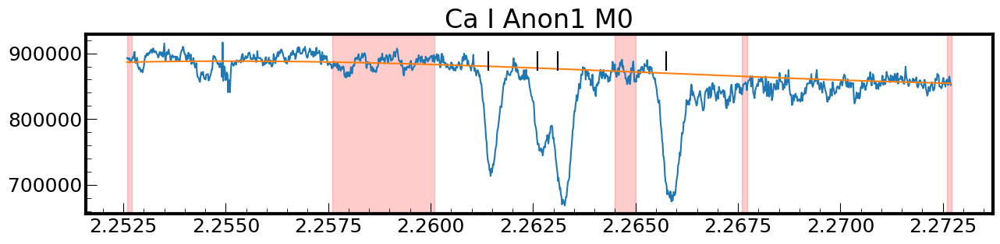

 48%|████▊     | 11/23 [00:02<00:03,  3.40it/s]

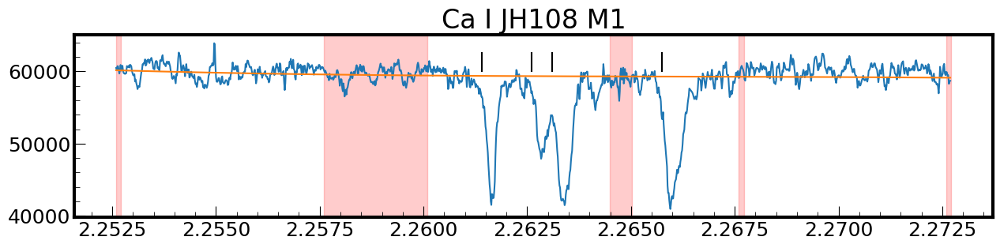

 52%|█████▏    | 12/23 [00:02<00:02,  3.77it/s]

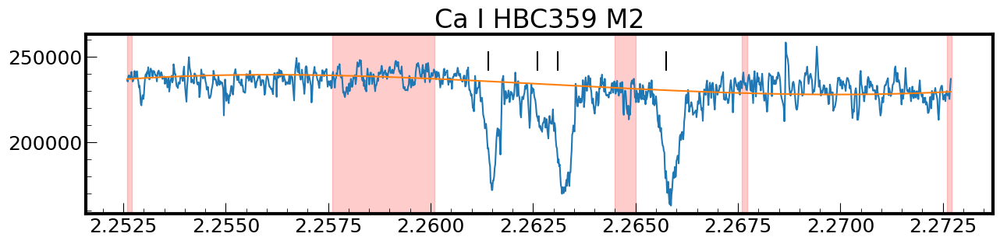

 57%|█████▋    | 13/23 [00:03<00:02,  4.08it/s]

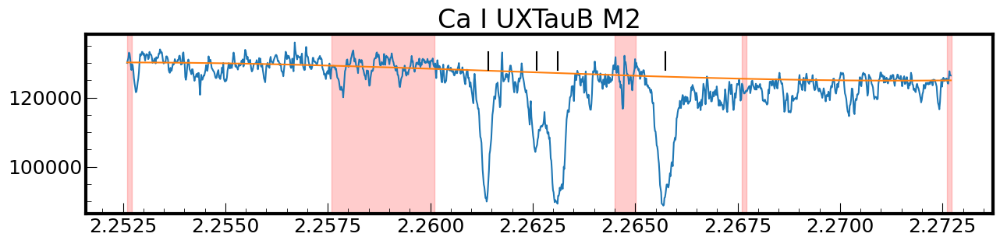

 61%|██████    | 14/23 [00:03<00:02,  4.06it/s]

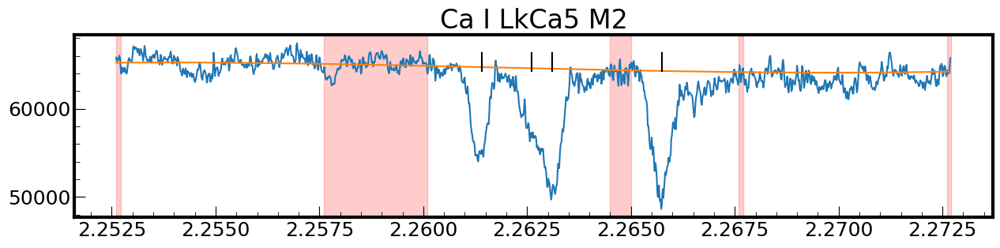

 65%|██████▌   | 15/23 [00:03<00:01,  4.43it/s]

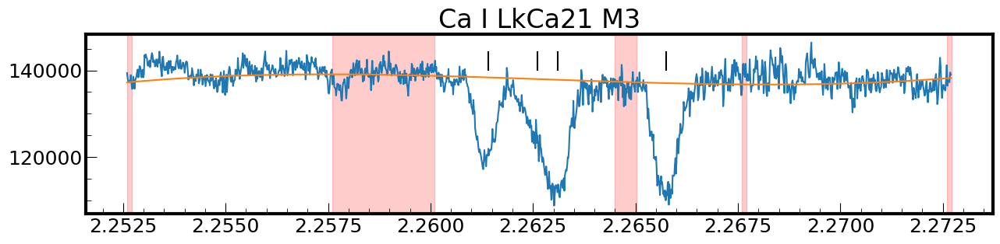

 70%|██████▉   | 16/23 [00:03<00:01,  4.54it/s]

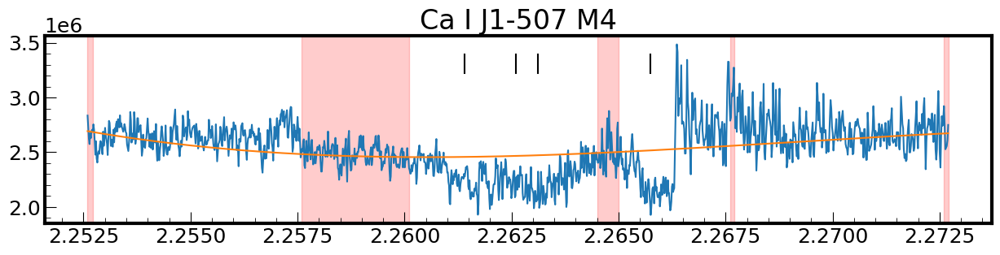

 74%|███████▍  | 17/23 [00:04<00:01,  4.27it/s]

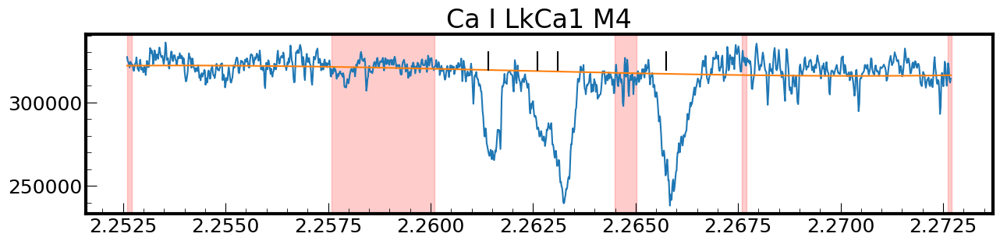

 78%|███████▊  | 18/23 [00:04<00:01,  4.54it/s]

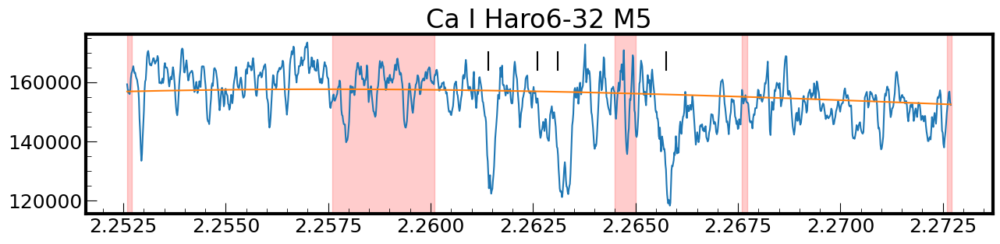

 83%|████████▎ | 19/23 [00:04<00:00,  4.74it/s]

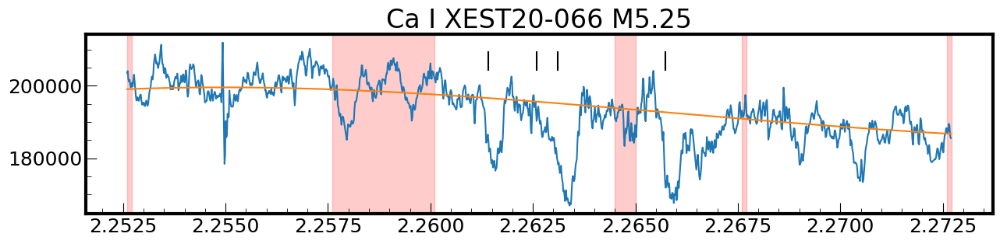

 87%|████████▋ | 20/23 [00:04<00:00,  3.18it/s]

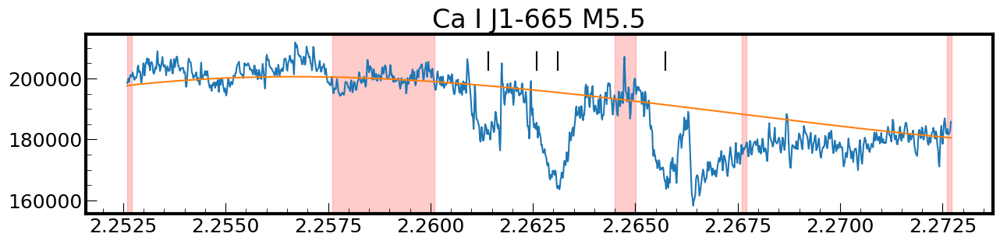

 91%|█████████▏| 21/23 [00:05<00:00,  3.33it/s]

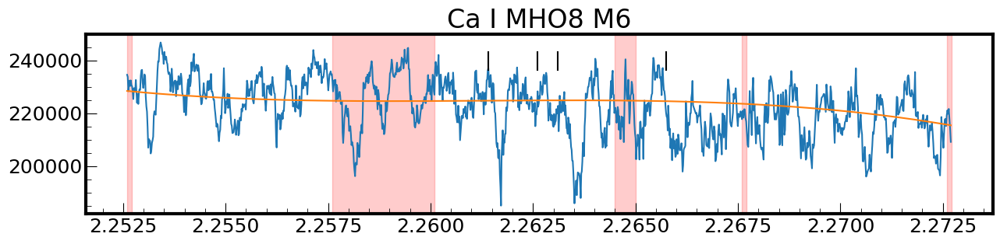

 96%|█████████▌| 22/23 [00:05<00:00,  3.70it/s]

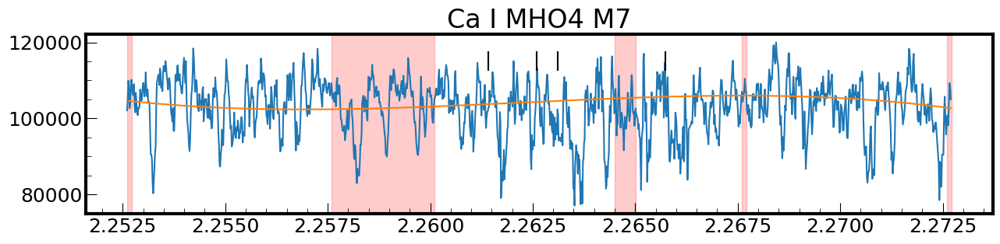

100%|██████████| 23/23 [00:05<00:00,  4.07it/s]


In [13]:
ca_reg_lines = list(lines_table[ca1_mask]['Observed'][:]) # list of Ca I lab wavelengths
ca_reg_lines.append(lines_table[fe1_mask]['Observed'][104])
ca_reg_lines = np.array(sorted(ca_reg_lines))

# Define the region for fitting
line_name = lines_table[ca1_mask][0]['Spectrum'] # Species
line_center = ca_reg_lines[1] # Wavelength

# from igrins_mod import local_continuum_fit
continuum_stack = []
continuum_err_stack = []
norm_flux_stack = []
norm_flux_err_stack = []
reg_idx_stack = []

# regions [left point,width]
regions = [(-1000,11), (-500,250), (190,51), (500,11) , (1000,11)]

# number of regions I use and subtract 1 since index starts at 0
n = len(regions)-1
poly_deg = 3
for i in tqdm(range(len(standard_table))):
    fig = plt.figure(figsize=(15,3))
    
    # Perform the continuum fit
    continuum, continuum_err, region_indices = ig.local_continuum_fit(wavelen_stack[:,i],
                                                       flux_stack[:,i],
                                                       flux_unc_stack[:,i],
                                                       poly_order = poly_deg,
                                                       line_center = line_center,
                                                       spec_res = spec_res,
                                                       regions = regions)
    # Append indices to list of indices
    reg_idx_stack.append(region_indices)
    
    # Append to list of local continuum arrays
    continuum_stack.append(continuum)
    continuum_err_stack.append(continuum_err)

    # Normalize flux by dividing the original flux by the continuum
    norm_flux = flux_stack[region_indices[0][0]:region_indices[n][1], i] / continuum
    norm_flux_stack.append(norm_flux)

    # Plot the raw flux and continuum
    plt.plot(wavelen_stack[region_indices[0][0]:region_indices[n][1], i], flux_stack[region_indices[0][0]:region_indices[n][1], i])
    plt.plot(wavelen_stack[region_indices[0][0]:region_indices[n][1], i], continuum_stack[i])

    # Highlight the regions and Ca I lines
    for j in range(len(region_indices)):
        plt.axvspan(wavelen_stack[region_indices[n - j][0], i], wavelen_stack[region_indices[n - j][1], i], color='red', alpha=0.2)

    for k in range(len(ca_reg_lines)):
        plt.axvline(ca_reg_lines[k], ymin=0.8, ymax=0.9, color='black')

    plt.title(f"{line_name} {standard_table['Name'][i]} {standard_table['Spectral_Type'][i]}")
    plt.show()

## Method 3

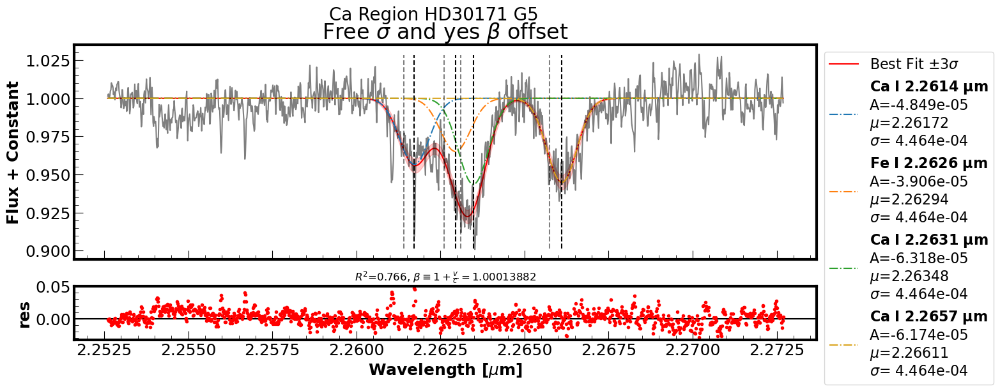

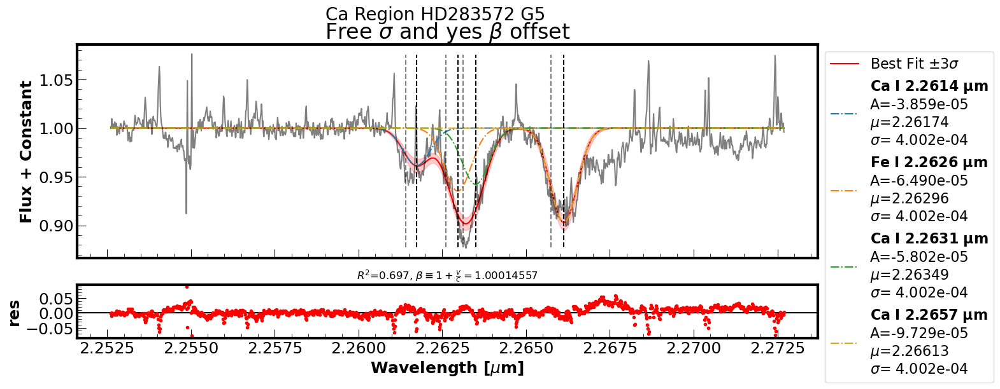

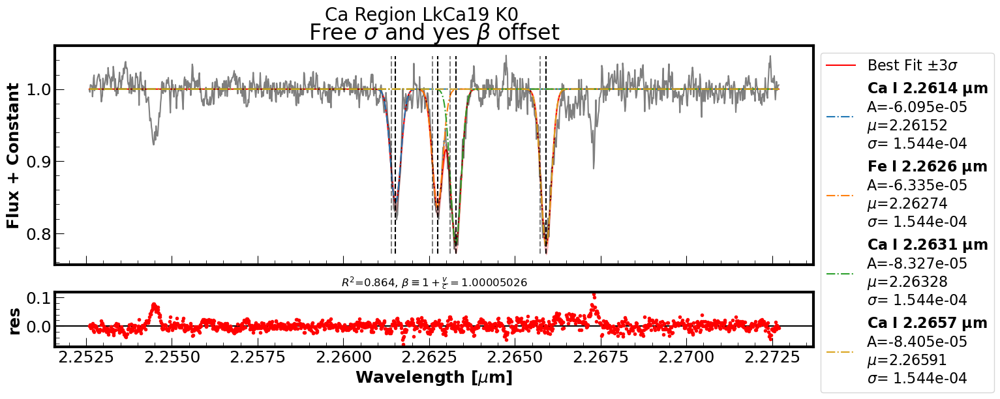

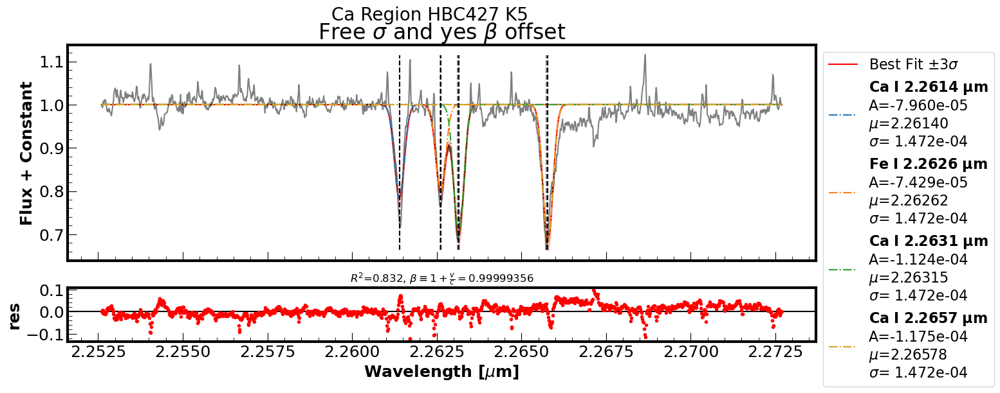

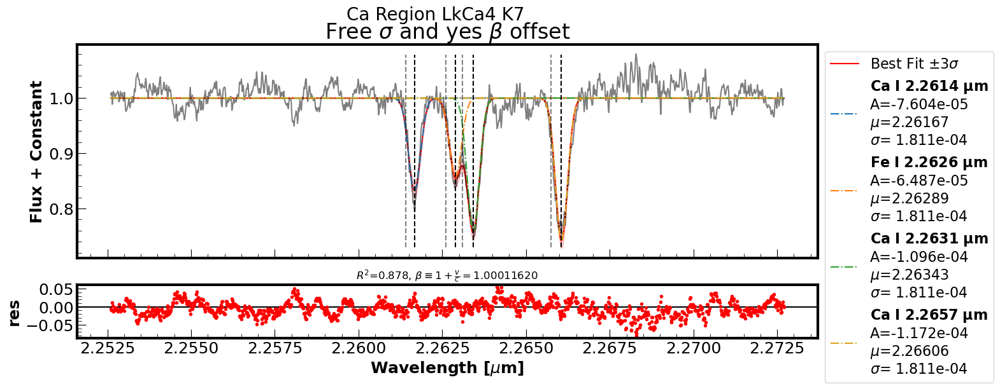

...

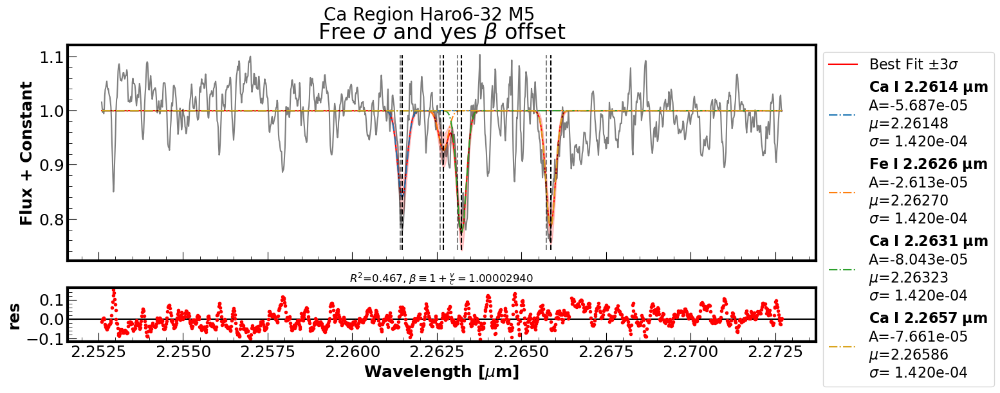

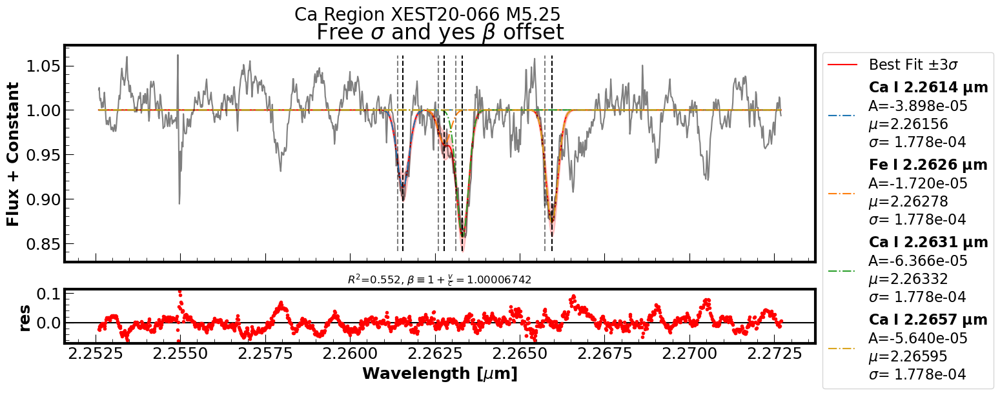

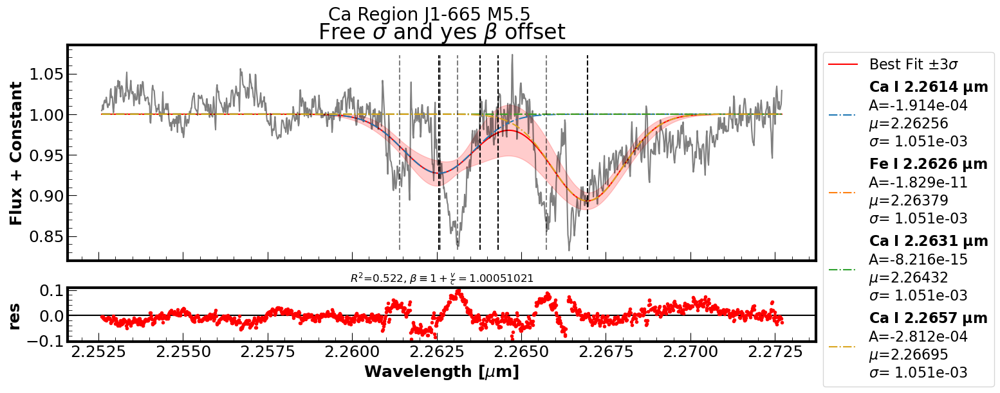

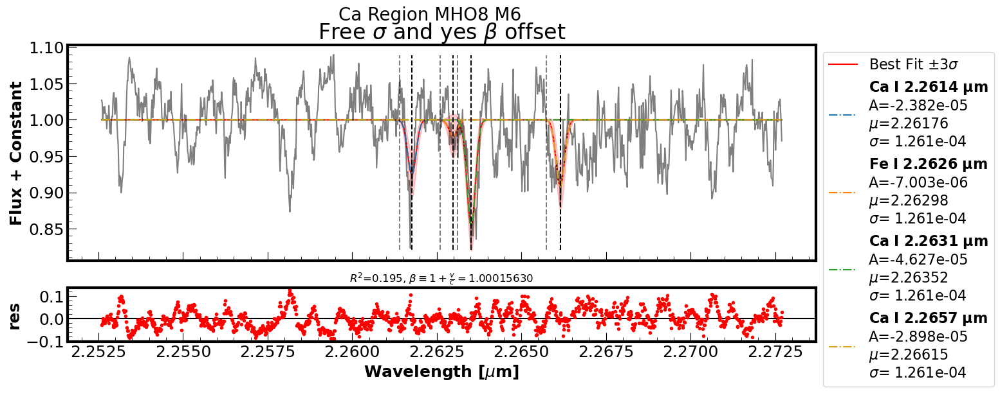

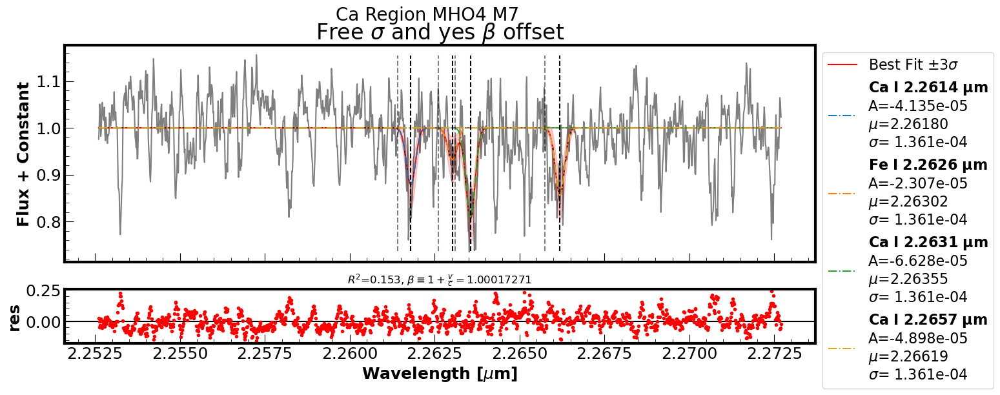

In [28]:
# Initialize storage lists
params_stack = []
beta_stack = []

params_error_stack = []

best_model_stack = []
result_stack = []
dely_stack = []

# For testing purposes
mean_sigma_stack = []

# ca_obs = ca_lines*(1+standard_table['v/c'][0]) # observed wavelengths (theoretically)

for i in range(len(standard_table)):    
    # Define initial parameters for Gaussian fitting
    params = Parameters()

    # Define Model
    model = Model(ig.four_gaussian_beta, nan_policy='omit')

    params.add('amp1', value = -1e-5, max = 0)
    params.add('c1', value = ca_reg_tweak[0])
    params.add('std1', min=0, value = 1.5e-4)

    params.add('amp2', value = -1e-5, max = 0)
    params.add('c2', value = ca_reg_tweak[1])
    params.add('std2', min=0, value = 1.5e-4)

    params.add('amp3', value = -1e-5, max = 0)
    params.add('c3', value = ca_reg_tweak[2])
    params.add('std3', min=0, value = 1.5e-4)

    params.add('amp4', value = -1e-5, max = 0)
    params.add('c4', value = ca_reg_tweak[3])
    params.add('std4', value = 1.5e-4)

    # tweak lab wavelengths
    params['c1'].expr = f'{ca_reg_tweak[0]}'
    params['c2'].expr = f'{ca_reg_tweak[1]}'
    params['c3'].expr = f'{ca_reg_tweak[2]}'
    params['c4'].expr = f'{ca_reg_tweak[3]}'

    params.add('beta', value=1.) # beta = (1+v/c)

    params['std2'].expr = 'std1' # constrain widths to be the same
    params['std3'].expr = 'std1'
    params['std4'].expr = 'std1'

    result = model.fit(norm_flux_stack[i], params,
                       x = wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])
                    #    weights = 1/flux_unc_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i])

    result_stack.append(result) # lmfit ModelResult objects
    dely = result.eval_uncertainty(sigma=3) # lmfit uncertainty
    dely_stack.append(dely)

    # Append the best_model, error and parameters stacks
    # could probably make a loop to the tune of for value in result etc...
    params_stack.extend([result.params['amp1'].value, result.params['c1'].value, result.params['std1'].value,
                         result.params['amp2'].value, result.params['c2'].value, result.params['std2'].value,
                         result.params['amp3'].value, result.params['c3'].value, result.params['std3'].value,
                         result.params['amp4'].value, result.params['c4'].value, result.params['std4'].value])

    beta_stack.append(result.params['beta'].value)
    
    params_error_stack.extend([result.params['amp1'].stderr, result.params['c1'].stderr, result.params['std1'].stderr,
                               result.params['amp2'].stderr, result.params['c2'].stderr, result.params['std2'].stderr,
                               result.params['amp3'].stderr, result.params['c3'].stderr, result.params['std3'].stderr,
                               result.params['amp4'].stderr, result.params['c4'].stderr, result.params['std4'].stderr])

    best_model_stack.append(result.best_fit)
    mean_sigma_stack.append(np.mean(a=(result.params['std1'].value, result.params['std2'].value, result.params['std3'].value, result.params['std4'].value)))

    # print(result.fit_report())
    # print(f"Widths: {result.params['std1'].value:.8f}, {result.params['std2'].value:.8f}, {result.params['std3'].value:.8f}, {result.params['std4'].value:.8f}")
    # print(f"Mean Width: {np.mean(a= (result.params['std1'].value, result.params['std2'].value, result.params['std3'].value, result.params['std4'].value)):.8f}")

params_arr = np.array(params_stack)
# 0: amplitude
# 1: centers
# 2: sigmas
amps = params_arr[0::3] # grab every amplitude
amps_err = params_error_stack[0::3]

centers = params_arr[1::3] # grab every center wavelength
center_err = params_error_stack[1::3]

sigmas = params_arr[2::3] # grab every sigma
sigmas_err = params_error_stack[2::3]

# print(centers)
# Gaussian model fits for each source
ca1_2_2614_fits = []
ca1_2_2631_fits = []
ca1_2_2657_fits = []
fe1_2_2626_fits = []
num_gauss = 4

# # Getting the individual Gaussians into their own lists
for i in range(len(standard_table)):
    ca1_2_2614_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[0::num_gauss][i], centers[0::num_gauss][i]*beta_stack[i], sigmas[0::num_gauss][i]))
    fe1_2_2626_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[1::num_gauss][i], centers[1::num_gauss][i]*beta_stack[i], sigmas[1::num_gauss][i]))
    ca1_2_2631_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[2::num_gauss][i], centers[2::num_gauss][i]*beta_stack[i], sigmas[2::num_gauss][i]))
    ca1_2_2657_fits.append(ig.gaussian(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], amps[3::num_gauss][i], centers[3::num_gauss][i]*beta_stack[i], sigmas[3::num_gauss][i]))
    

# Plotting each component Gaussian and the best model fit
for i in range(len(standard_table)):
    # Create subplots with adjusted size ratios
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6), gridspec_kw={'height_ratios': [4, 1]}, sharex=True)

    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], best_model_stack[i], c='red', label=r'Best Fit $\pm 3 \sigma$')
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], norm_flux_stack[i], c='black', alpha=0.5)
    # ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], result_stack[i].init_fit, '--', c='blue' , alpha=0.2, label='initial fit')

    ax1.fill_between(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i],
                    best_model_stack[i]-dely_stack[i], best_model_stack[i]+dely_stack[i],
                    alpha=0.2, color = 'red' )

    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2614_fits[i], ls='-.',
        label=r'$\bf{Ca~I~2.2614~\mu m}$' "\n" rf"A={amps[0::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[0::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[0::num_gauss][i]:.3e}")
    # rf"$\pm {amps_err[0::num_gauss][i]:.3e}$"
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], fe1_2_2626_fits[i], ls='-.',
        label=r'$\bf{Fe~I~2.2626~\mu m}$' "\n" rf"A={amps[1::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[1::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[1::num_gauss][i]:.3e}")
    
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2631_fits[i], ls='-.',
        label=r'$\bf{Ca~I~2.2631~\mu m}$' "\n" rf"A={amps[2::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[2::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[2::num_gauss][i]:.3e}")
    
    ax1.plot(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i], ca1_2_2657_fits[i], ls='-.', color='goldenrod',
        label=r'$\bf{Ca~I~2.2657~\mu m}$' "\n" rf"A={amps[3::num_gauss][i]:.3e}" "\n" rf"$\mu$={centers[3::num_gauss][i]*beta_stack[i]:.5f}" "\n" rf"$\sigma$= {sigmas[3::num_gauss][i]:.3e}")
    
    for j in range(len(ca_reg_lines)):
        ax1.axvline(ca_reg_lines[j], ymin=0.05, ymax=0.95,ls='--', color='black',alpha=0.5)
        ax1.axvline(ca_reg_tweak[j]*beta_stack[i], ymin=0.05, ymax=0.95,ls='--', color='black')
    
    plt.suptitle(rf"Ca Region {standard_table['Name'][i]} {standard_table['Spectral_Type'][i]}")

    ax1.set_ylabel('Flux + Constant')
    ax1.legend(bbox_to_anchor=(1,1))
    ax1.set_title(r'Free $\sigma$ and yes $\beta$ offset')

    # Calculate residuals
    residuals = (norm_flux_stack[i] - best_model_stack[i])
    # sqsum_res = np.sum(residuals**2)
    # sqsum = np.sum((norm_flux_stack[i]-np.mean(norm_flux_stack[i])**2))
    # R2 = 1-(sqsum_res/sqsum)

    # Plot residuals
    # ax2.scatter(wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1], i], residuals, c='red', label='Residuals', s=3)
    result_stack[i].plot_residuals(ax=ax2, datafmt='r.')
    
    # ax2.axhline(y=0, color='grey', linestyle='--')
    # ax2.set_ylim(-0.1,0.1)
    ax2.set_xlabel(r'Wavelength [$\mu$m]')
    ax2.set_ylabel('res')
    ax2.set_title(rf"$R^2$={result_stack[i].rsquared:.3f}, " r'$\beta \equiv 1+\frac{v}{c}= $' f"{beta_stack[i]:.8f}", fontsize=12)

    # Define the folder path
    folder_path = 'Standards/ca_region'

    # Create the folder if it doesn't exist
    os.makedirs(folder_path, exist_ok=True)

    # Save the plot to the file within the folder
    plt.savefig(f'{folder_path}/{standard_table["Name"][i]}_linefit.png')

    plt.show()

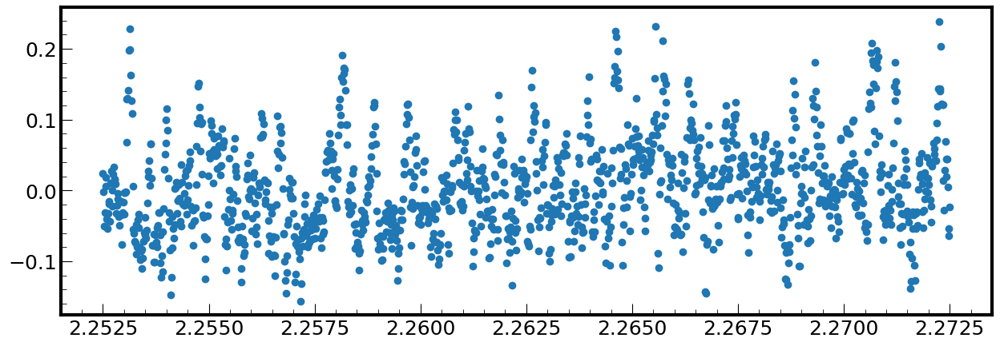

In [27]:
plt.figure(figsize=(15,5))
plt.scatter(np.linspace(2.2525,2.2725,len(result_stack[-1].residual)), result_stack[-1].residual)
plt.show()

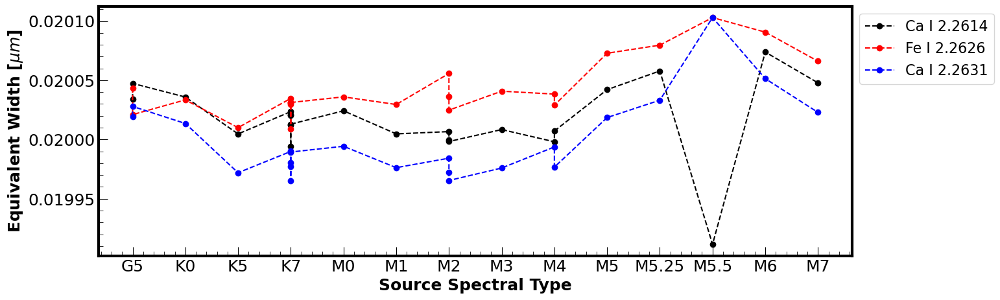

In [15]:
ew1_stack = []
ew2_stack = []
ew3_stack = []
ew4_stack = []

for i in range(len(standard_table)):
    ew1 = np.trapz(np.abs(ca1_2_2614_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    ew2 = np.trapz(np.abs(fe1_2_2626_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    ew3 = np.trapz(np.abs(ca1_2_2631_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    # ew4 = np.trapz(np.abs(1-ca1_2_2657_fits[i]), wavelen_stack[reg_idx_stack[i][0][0]:reg_idx_stack[i][n][1],i])
    
    ew1_stack.append(ew1)
    ew2_stack.append(ew2)
    ew3_stack.append(ew3)
    # ew4_stack.append(ew4)

fig = plt.figure(figsize=(15,5))
# for i in range(len(standard_table)):

plt.plot(standard_table['Spectral_Type'], ew1_stack, ls='--', marker='o', c ='k', label = 'Ca I 2.2614')
plt.plot(standard_table['Spectral_Type'], ew2_stack, ls='--', marker='o', c ='red', label = 'Fe I 2.2626')
plt.plot(standard_table['Spectral_Type'], ew3_stack, ls='--', marker='o', c ='blue', label = 'Ca I 2.2631')
# plt.plot(standard_table['Spectral_Type'], ew4_stack, ls='--', marker='o', c ='green', label = 'Ca I 2.2657')

plt.xlabel('Source Spectral Type')
plt.ylabel(r'Equivalent Width [$\mu m$]')

# Define the folder path
folder_path = 'Standards/ca_region'

# Create the folder if it doesn't exist
os.makedirs(folder_path, exist_ok=True)

# Save the plot to the file within the folder
plt.savefig(f'{folder_path}/ca_region_{standard_table["Name"][i]}_eqwidth.png')

plt.legend(bbox_to_anchor=(1,1))
plt.show()

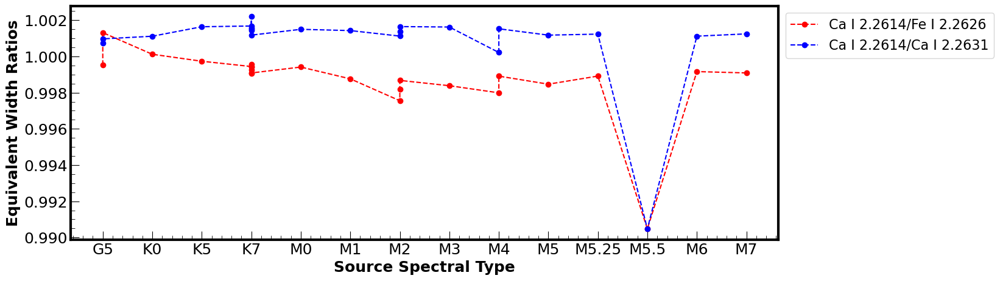

In [16]:
fig = plt.figure(figsize=(15,5))
# for i in range(len(standard_table)):

# plt.plot(standard_table['Spectral_Type'], np.array(ew1_stack)/np.array(ew1_stack), ls='--', marker='o', c ='k', label = 'Ca I 2.2614')
plt.plot(standard_table['Spectral_Type'], np.array(ew1_stack)/np.array(ew2_stack), ls='--', marker='o', c ='red', label = 'Ca I 2.2614/Fe I 2.2626')
plt.plot(standard_table['Spectral_Type'], np.array(ew1_stack)/np.array(ew3_stack), ls='--', marker='o', c ='blue', label = 'Ca I 2.2614/Ca I 2.2631')
# plt.plot(standard_table['Spectral_Type'], ew4_stack, ls='--', marker='o', c ='green', label = 'Ca I 2.2657')

plt.xlabel('Source Spectral Type')
plt.ylabel(r'Equivalent Width Ratios')

# Define the folder path
folder_path = 'Standards/ca_region'

# Create the folder if it doesn't exist
os.makedirs(folder_path, exist_ok=True)

# Save the plot to the file within the folder
plt.savefig(f'{folder_path}/ca_region_{standard_table["Name"][i]}_ew_ratios.png')

plt.legend(bbox_to_anchor=(1,1))
plt.show()